In [2]:
import pandas as pd
import numpy as np

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [5]:
dataset = pd.read_csv('/content/predictive_maintenance.csv')

In [6]:
dataset.head()

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,No Failure
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,No Failure
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,No Failure
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,No Failure
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,No Failure


In [7]:
dataset['Failure Type'].value_counts()

,count
Failure Type,
No Failure,9652
Heat Dissipation Failure,112
Power Failure,95
Overstrain Failure,78
Tool Wear Failure,45
Random Failures,18


In [ ]:
dataset.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
UDI,10000.0,5000.50000,2886.895680,1.0,2500.75,5000.5,7500.25,10000.0
Air temperature [K],10000.0,300.00493,2.000259,295.3,298.30,300.1,301.50,304.5
Process temperature [K],10000.0,310.00556,1.483734,305.7,308.80,310.1,311.10,313.8
Rotational speed [rpm],10000.0,1538.77610,179.284096,1168.0,1423.00,1503.0,1612.00,2886.0
Torque [Nm],10000.0,39.98691,9.968934,3.8,33.20,40.1,46.80,76.6
Tool wear [min],10000.0,107.95100,63.654147,0.0,53.00,108.0,162.00,253.0
Target,10000.0,0.03390,0.180981,0.0,0.00,0.0,0.00,1.0


In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   UDI                      10000 non-null  int64  
 1   Product ID               10000 non-null  object 
 2   Type                     10000 non-null  object 
 3   Air temperature [K]      10000 non-null  float64
 4   Process temperature [K]  10000 non-null  float64
 5   Rotational speed [rpm]   10000 non-null  int64  
 6   Torque [Nm]              10000 non-null  float64
 7   Tool wear [min]          10000 non-null  int64  
 8   Target                   10000 non-null  int64  
 9   Failure Type             10000 non-null  object 
dtypes: float64(3), int64(4), object(3)
memory usage: 781.4+ KB


In [ ]:
dataset.isnull().sum()

,0
UDI,0
Product ID,0
Type,0
Air temperature [K],0
Process temperature [K],0
Rotational speed [rpm],0
Torque [Nm],0
Tool wear [min],0
Target,0
Failure Type,0


In [8]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

label_encoder = LabelEncoder()
dataset['Type'] = label_encoder.fit_transform(dataset['Type'])
dataset['Failure Type'] = label_encoder.fit_transform(dataset['Failure Type'])


In [9]:
dataset.drop(['UDI', 'Product ID'], axis=1, inplace=True)

In [10]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
dataset[['Air temperature [K]', 'Process temperature [k]', 'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]']] = scaler.fit_transform(
    dataset[['Air temperature [K]', 'Process temperature [K]', 'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]']]
)

In [11]:
print(dataset['Target'].value_counts())

Target
0    9661
1     339
Name: count, dtype: int64


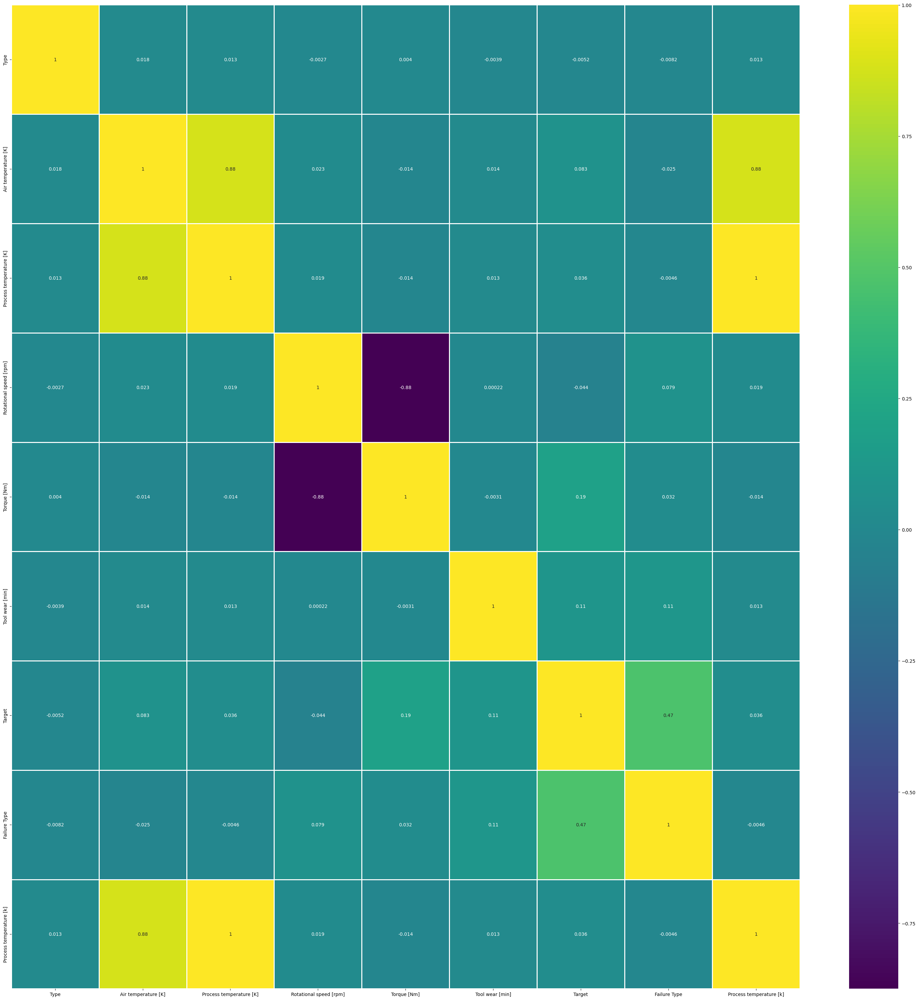

In [12]:
corr = dataset.corr()
plt.figure(figsize=(30,30))
sns.heatmap(corr,annot=True, linewidths=2, cmap='viridis')
plt.tight_layout()

In [13]:
corr.sort_index(ascending=True)

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type,Process temperature [k]
Air temperature [K],0.017599,1.000000,0.876107,0.022670,-0.013778,0.013853,0.082556,-0.025327,0.876107
Failure Type,-0.008249,-0.025327,-0.004600,0.079407,0.031737,0.111619,0.470541,1.000000,-0.004600
Process temperature [K],0.013444,0.876107,1.000000,0.019277,-0.014061,0.013488,0.035946,-0.004600,1.000000
Process temperature [k],0.013444,0.876107,1.000000,0.019277,-0.014061,0.013488,0.035946,-0.004600,1.000000
Rotational speed [rpm],-0.002693,0.022670,0.019277,1.000000,-0.875027,0.000223,-0.044188,0.079407,0.019277
Target,-0.005152,0.082556,0.035946,-0.044188,0.191321,0.105448,1.000000,0.470541,0.035946
Tool wear [min],-0.003930,0.013853,0.013488,0.000223,-0.003093,1.000000,0.105448,0.111619,0.013488
Torque [Nm],0.004011,-0.013778,-0.014061,-0.875027,1.000000,-0.003093,0.191321,0.031737,-0.014061
Type,1.000000,0.017599,0.013444,-0.002693,0.004011,-0.003930,-0.005152,-0.008249,0.013444


## Data Visualization

---



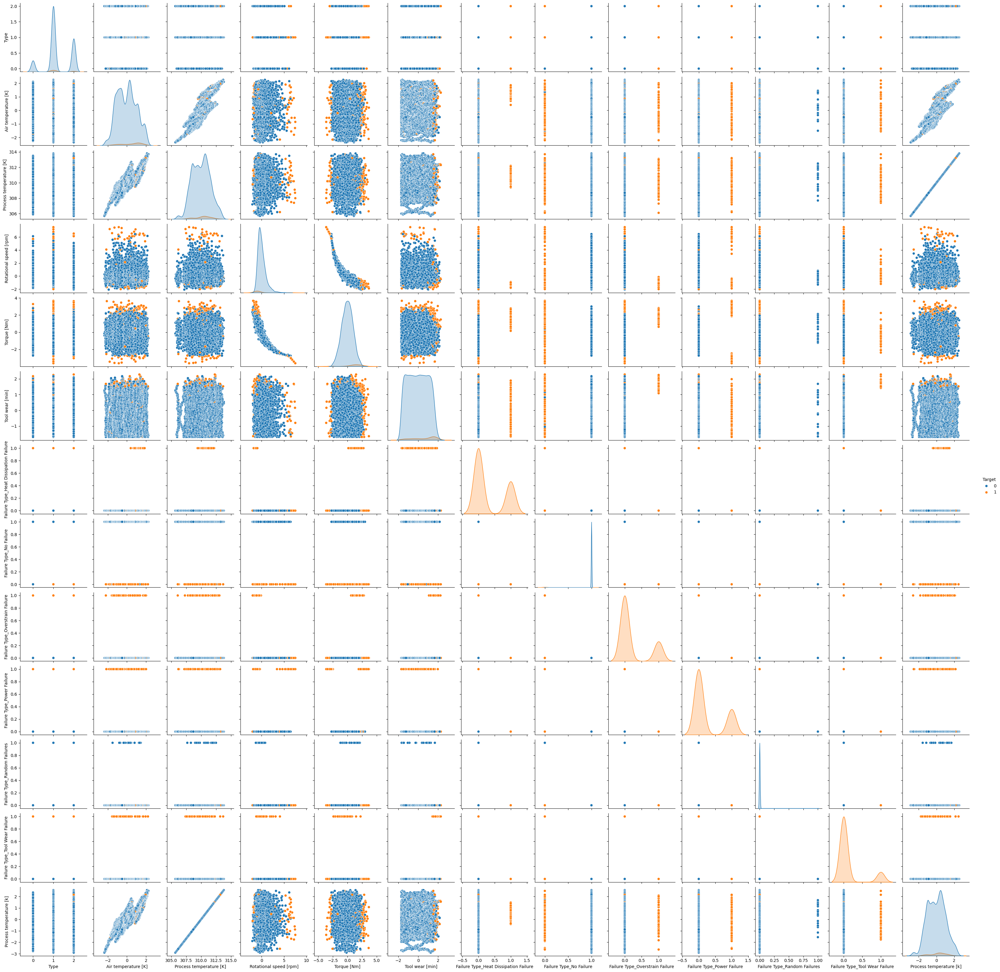

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.pairplot(dataset, hue="Target", diag_kind="kde")
plt.show()

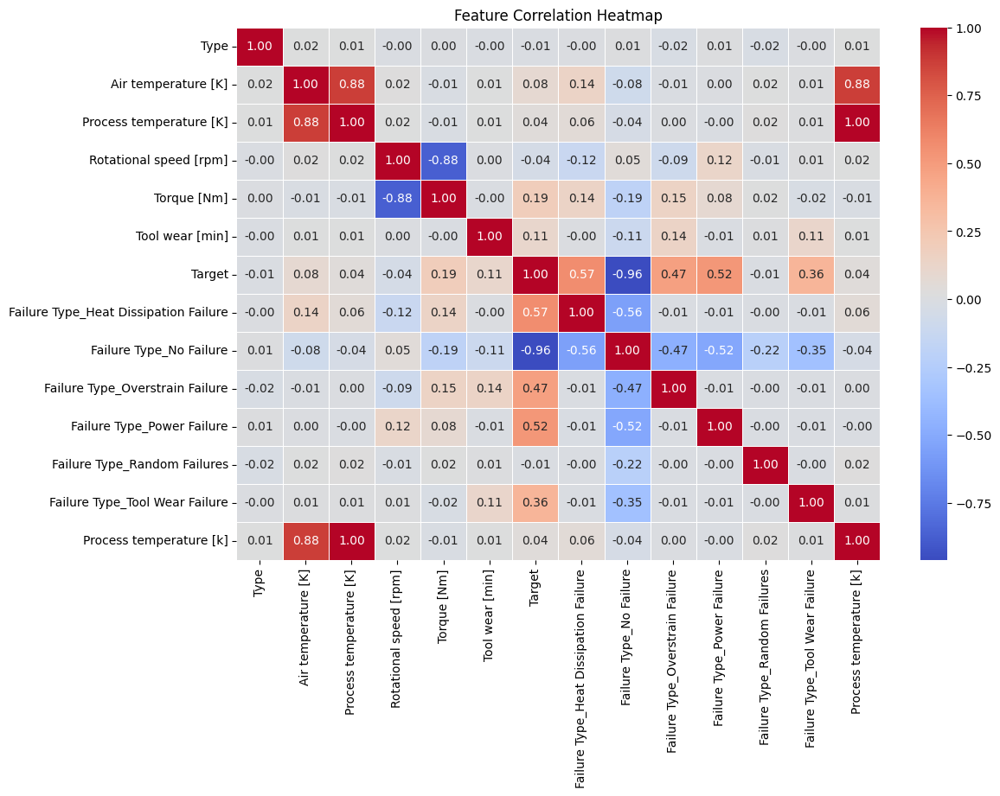

In [ ]:
plt.figure(figsize=(12,8))
sns.heatmap(dataset.corr(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Feature Correlation Heatmap")
plt.show()

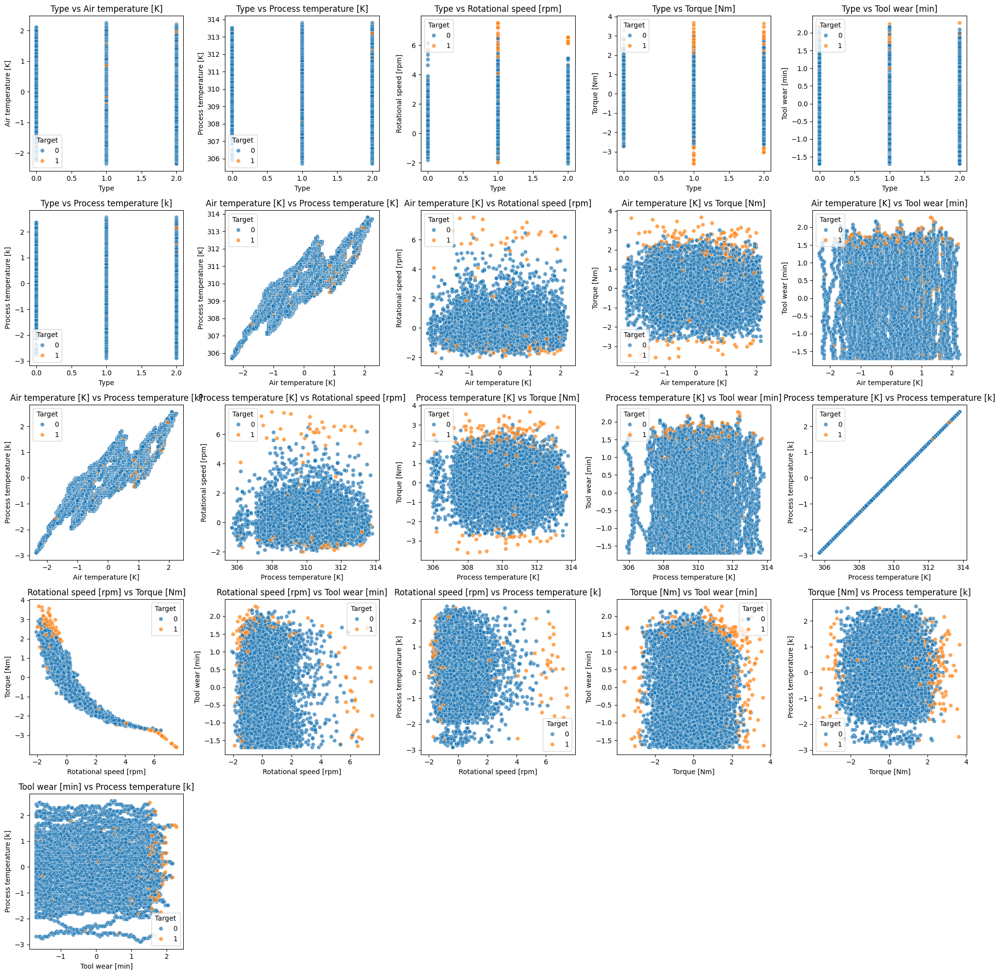

In [ ]:
import itertools

dataset['Target'] = dataset['Target'].astype(str)

num_cols = dataset.select_dtypes(include=['float64', 'int64']).columns

plt.figure(figsize=(20, 20))
for i, (col1, col2) in enumerate(itertools.combinations(num_cols, 2), 1):
    plt.subplot(5, 5, i)
    sns.scatterplot(data=dataset, x=col1, y=col2, hue="Target", alpha=0.7)
    plt.title(f"{col1} vs {col2}")

plt.tight_layout()
plt.show()



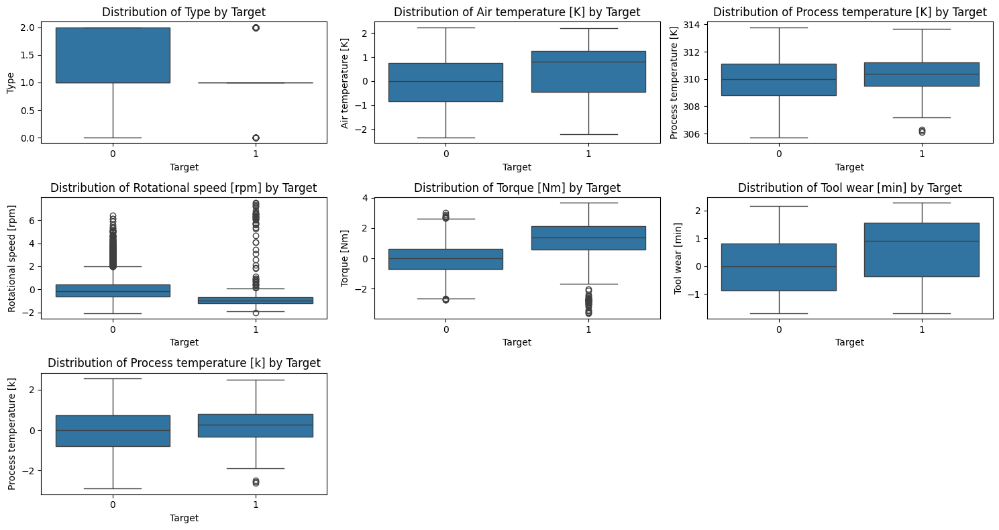

In [ ]:
dataset.columns = dataset.columns.str.strip()
dataset['Target']=dataset['Target'].astype(str)

plt.figure(figsize=(15,8))
for i, col in enumerate(dataset.select_dtypes(include=['float64', 'int64']).columns, 1):
    plt.subplot(3,3,i)
    sns.boxplot(data=dataset, x= "Target", y=col)
    plt.title(f"Distribution of {col} by Target")

plt.tight_layout()
plt.show()

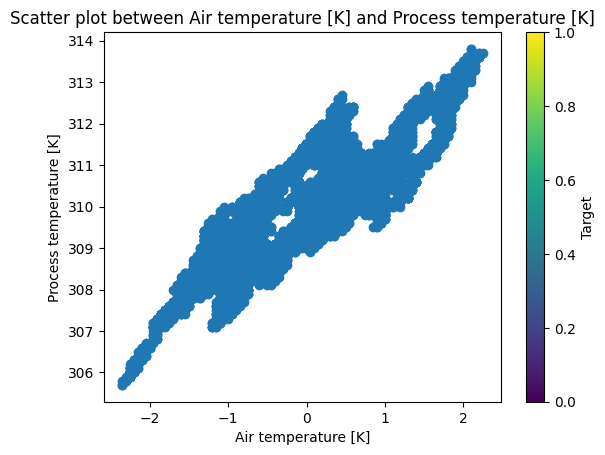

In [ ]:
plt.scatter(dataset['Air temperature [K]'], dataset['Process temperature [K]'])
plt.title('Scatter plot between Air temperature [K] and Process temperature [K]')
plt.xlabel('Air temperature [K]')
plt.ylabel('Process temperature [K]')
plt.colorbar(label='Target')
plt.show()

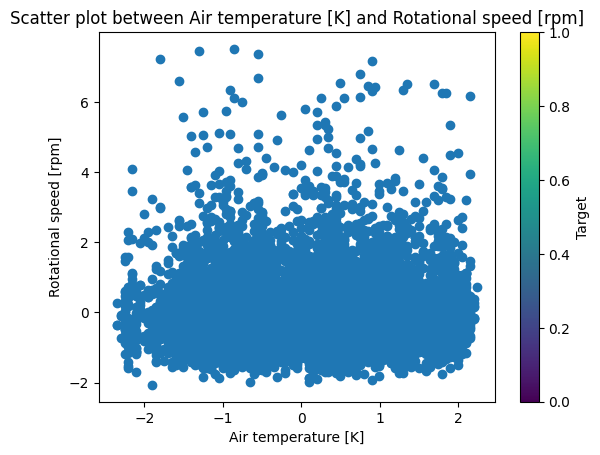

In [ ]:
plt.scatter(dataset['Air temperature [K]'], dataset['Rotational speed [rpm]'])
plt.title('Scatter plot between Air temperature [K] and Rotational speed [rpm]')
plt.xlabel('Air temperature [K]')
plt.ylabel('Rotational speed [rpm]')
plt.colorbar(label='Target')
plt.show()

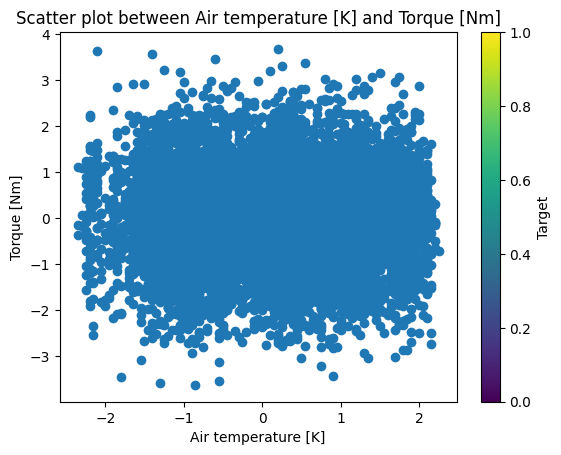

In [ ]:
plt.scatter(dataset['Air temperature [K]'], dataset['Torque [Nm]'])
plt.title('Scatter plot between Air temperature [K] and Torque [Nm]')
plt.xlabel('Air temperature [K]')
plt.ylabel('Torque [Nm]')
plt.colorbar(label='Target')
plt.show()

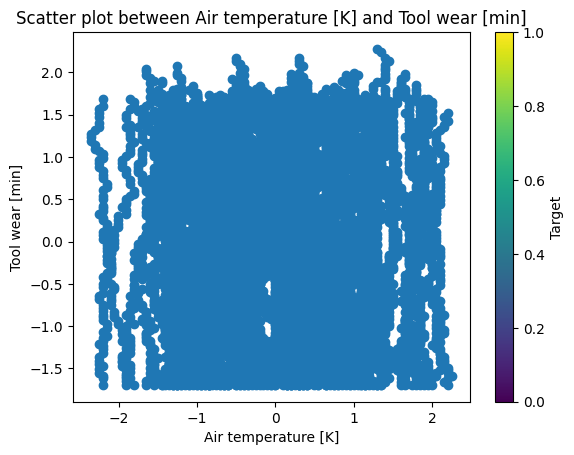

In [ ]:
plt.scatter(dataset['Air temperature [K]'], dataset['Tool wear [min]'])
plt.title('Scatter plot between Air temperature [K] and Tool wear [min]')
plt.xlabel('Air temperature [K]')
plt.ylabel('Tool wear [min]')
plt.colorbar(label='Target')
plt.show()

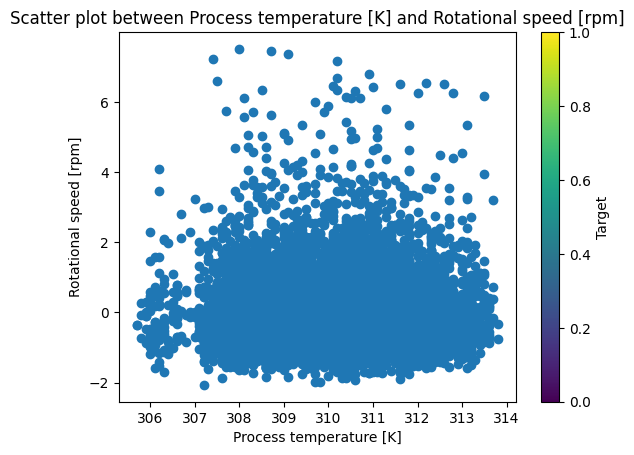

In [ ]:
plt.scatter(dataset['Process temperature [K]'], dataset['Rotational speed [rpm]'])
plt.title('Scatter plot between Process temperature [K] and Rotational speed [rpm]')
plt.xlabel('Process temperature [K]')
plt.ylabel('Rotational speed [rpm]')
plt.colorbar(label='Target')
plt.show()

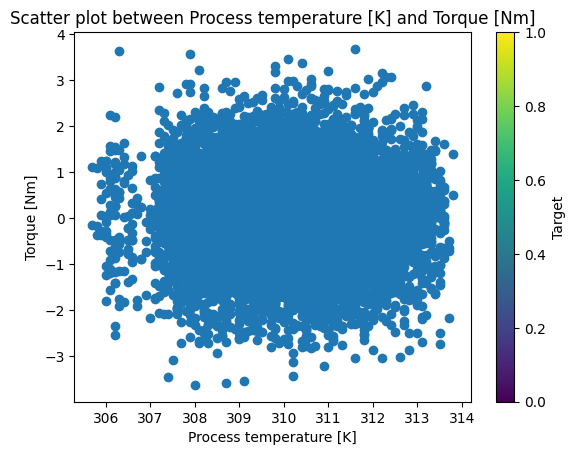

In [ ]:
plt.scatter(dataset['Process temperature [K]'], dataset['Torque [Nm]'])
plt.title('Scatter plot between Process temperature [K] and Torque [Nm]')
plt.xlabel('Process temperature [K]')
plt.ylabel('Torque [Nm]')
plt.colorbar(label='Target')
plt.show()

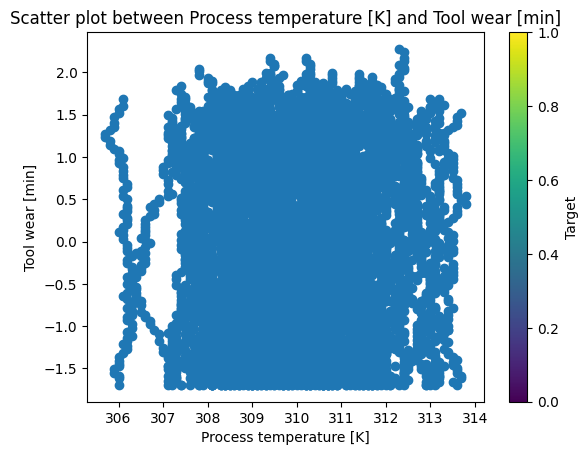

In [ ]:
plt.scatter(dataset['Process temperature [K]'], dataset['Tool wear [min]'])
plt.title('Scatter plot between Process temperature [K] and Tool wear [min]')
plt.xlabel('Process temperature [K]')
plt.ylabel('Tool wear [min]')
plt.colorbar(label='Target')
plt.show()

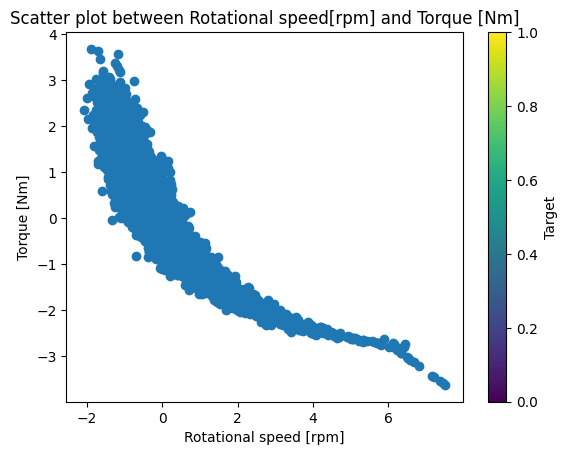

In [ ]:
plt.scatter(dataset['Rotational speed [rpm]'], dataset['Torque [Nm]'])
plt.title('Scatter plot between Rotational speed[rpm] and Torque [Nm]')
plt.xlabel('Rotational speed [rpm]')
plt.ylabel('Torque [Nm]')
plt.colorbar(label='Target')
plt.show()

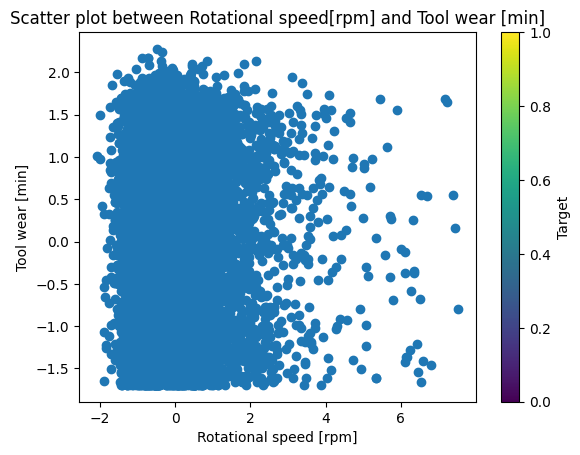

In [ ]:
plt.scatter(dataset['Rotational speed [rpm]'], dataset['Tool wear [min]'])
plt.title('Scatter plot between Rotational speed[rpm] and Tool wear [min]')
plt.xlabel('Rotational speed [rpm]')
plt.ylabel('Tool wear [min]')
plt.colorbar(label='Target')
plt.show()

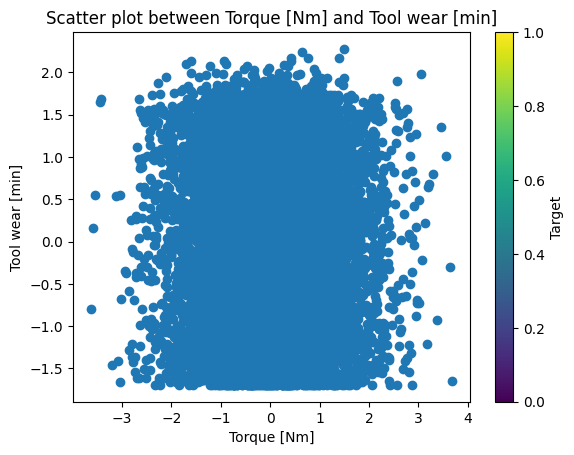

In [ ]:
plt.scatter(dataset['Torque [Nm]'], dataset['Tool wear [min]'])
plt.title('Scatter plot between Torque [Nm] and Tool wear [min]')
plt.xlabel('Torque [Nm]')
plt.ylabel('Tool wear [min]')
plt.colorbar(label='Target')
plt.show()

<Axes: xlabel='Target'>

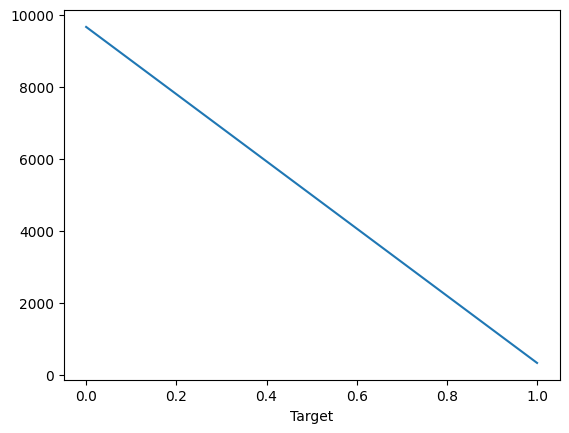

In [14]:
dataset['Target'].value_counts().plot()

<ipython-input-15-00bfe1aaf141>:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=dataset['Target'], palette='bright')


<Axes: xlabel='Target', ylabel='count'>

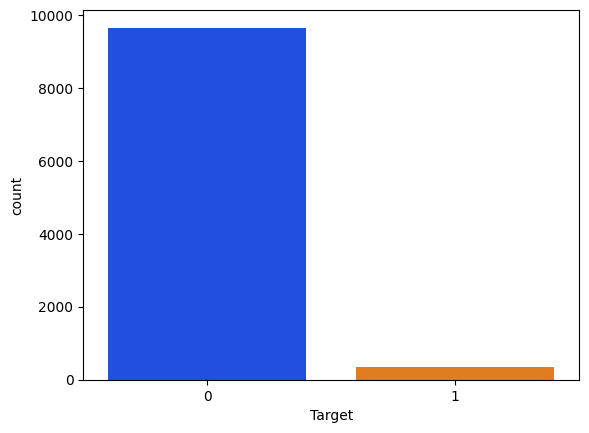

In [15]:
sns.countplot(x=dataset['Target'], palette='bright')

## Feature Selection

---



In [16]:
dataset.head()

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type,Process temperature [k]
0,2,-0.952389,308.6,0.068185,0.282200,-1.695984,0,1,-0.947360
1,1,-0.902393,308.7,-0.729472,0.633308,-1.648852,0,1,-0.879959
2,1,-0.952389,308.5,-0.227450,0.944290,-1.617430,0,1,-1.014761
3,1,-0.902393,308.6,-0.590021,-0.048845,-1.586009,0,1,-0.947360
4,1,-0.902393,308.7,-0.729472,0.001313,-1.554588,0,1,-0.879959


In [17]:
dataset.columns

Index(['Type', 'Air temperature [K]', 'Process temperature [K]',
       'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]', 'Target',
       'Failure Type', 'Process temperature [k]'],
      dtype='object')

In [18]:
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()
dataset['Failure Type'] = encoder.fit_transform(dataset['Failure Type'])

print(dataset['Failure Type'].value_counts())

Failure Type
1    9652
0     112
3      95
2      78
5      45
4      18
Name: count, dtype: int64


In [19]:
numeric_df = dataset.select_dtypes(include=['float64', 'int64'])

In [20]:
correlation_with_target = numeric_df.corr()['Failure Type'].sort_values(ascending=False)

In [21]:
print(correlation_with_target)

Failure Type               1.000000
Target                     0.470541
Tool wear [min]            0.111619
Rotational speed [rpm]     0.079407
Torque [Nm]                0.031737
Process temperature [K]   -0.004600
Process temperature [k]   -0.004600
Type                      -0.008249
Air temperature [K]       -0.025327
Name: Failure Type, dtype: float64


<ipython-input-62-ea8212cc1b30>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=correlation_with_target.index, y=correlation_with_target.values, palette='viridis')


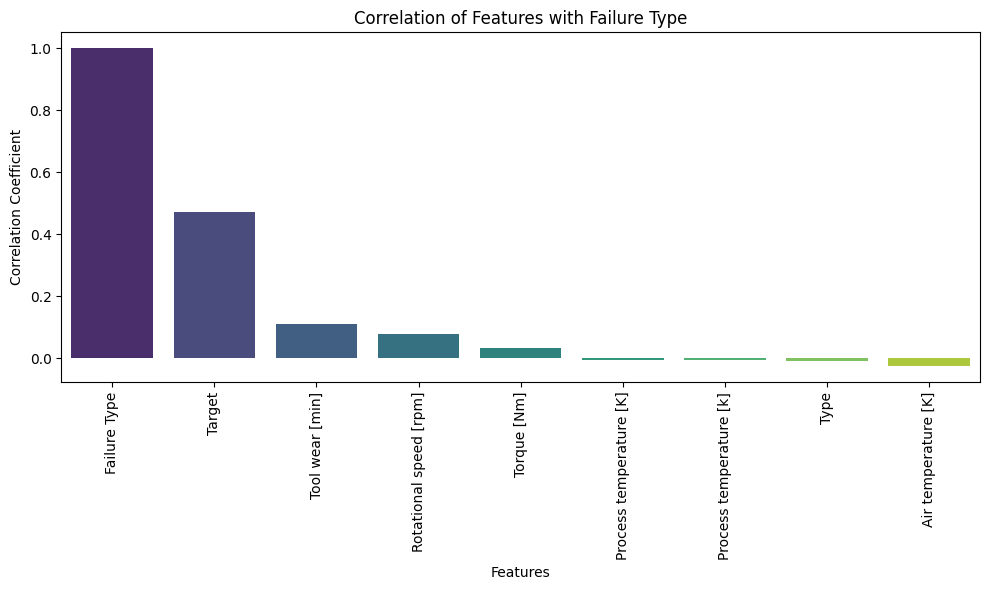

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(x=correlation_with_target.index, y=correlation_with_target.values, palette='viridis')
plt.xticks(rotation=90)
plt.title(f"Correlation of Features with Failure Type")
plt.xlabel('Features')
plt.ylabel('Correlation Coefficient')
plt.tight_layout()
plt.show()

In [22]:
columns_to_drop = ['Type','Target']

In [23]:
dataset = dataset.drop(columns=columns_to_drop)

In [24]:
dataset.head()

,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Failure Type,Process temperature [k]
0,-0.952389,308.6,0.068185,0.282200,-1.695984,1,-0.947360
1,-0.902393,308.7,-0.729472,0.633308,-1.648852,1,-0.879959
2,-0.952389,308.5,-0.227450,0.944290,-1.617430,1,-1.014761
3,-0.902393,308.6,-0.590021,-0.048845,-1.586009,1,-0.947360
4,-0.902393,308.7,-0.729472,0.001313,-1.554588,1,-0.879959


In [25]:
columns_to_drop = ['Process temperature [K]']
data = dataset.drop(columns=columns_to_drop)

In [26]:
data.columns

Index(['Air temperature [K]', 'Rotational speed [rpm]', 'Torque [Nm]',
       'Tool wear [min]', 'Failure Type', 'Process temperature [k]'],
      dtype='object')

In [27]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 6 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Air temperature [K]      10000 non-null  float64
 1   Rotational speed [rpm]   10000 non-null  float64
 2   Torque [Nm]              10000 non-null  float64
 3   Tool wear [min]          10000 non-null  float64
 4   Failure Type             10000 non-null  int64  
 5   Process temperature [k]  10000 non-null  float64
dtypes: float64(5), int64(1)
memory usage: 468.9 KB


## Data Normalization

---



In [28]:
from sklearn.preprocessing import StandardScaler

In [29]:
X=data.drop('Failure Type', axis=1)
y=data['Failure Type']

In [30]:
scaler=StandardScaler()

In [31]:
X_scaled=scaler.fit_transform(X)

In [32]:
X_scaled

array([[-0.95238944,  0.06818514,  0.28219976, -1.69598374, -0.94735989],
       [-0.90239341, -0.72947151,  0.63330802, -1.6488517 , -0.879959  ],
       [-0.95238944, -0.22744984,  0.94428963, -1.61743034, -1.01476077],
       ...,
       [-0.50242514,  0.59251888, -0.66077672, -1.35034876, -0.94735989],
       [-0.50242514, -0.72947151,  0.85400464, -1.30321671, -0.879959  ],
       [-0.50242514, -0.2162938 ,  0.02137647, -1.22466331, -0.879959  ]])

In [33]:
y

,Failure Type
0,1
1,1
2,1
3,1
4,1
...,...
9995,1
9996,1
9997,1
9998,1


# Model Train "Failure Type" as a Target Column

## Train Test Split

---



In [34]:
from sklearn.model_selection import train_test_split

In [35]:
data['Failure Type'].value_counts()

,count
Failure Type,
1,9652
0,112
3,95
2,78
5,45
4,18


In [36]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42, stratify=y)

## Implement Ensemble Models

---



In [37]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.preprocessing import label_binarize

In [38]:
from sklearn.metrics import classification_report, roc_auc_score

def evaluate_multiclass(y_true, y_pred, y_proba):
    report = classification_report(y_true, y_pred, output_dict=True)

    metrics = {
        "Accuracy": report['accuracy'],
        "Precision (Macro)": report['macro avg']['precision'],
        "Recall (Macro)": report['macro avg']['recall'],
        "F1 Score (Macro)": report['macro avg']['f1-score'],
        "ROC AUC Score (Macro)": roc_auc_score(y_true, y_proba, multi_class="ovr")  # One-vs-Rest
    }
    return metrics

### Bagging

In [44]:
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix

Decision Tree

In [ ]:
tree_model = DecisionTreeClassifier(random_state=42)

In [ ]:
tree_model.fit(X_train,y_train)

DecisionTreeClassifier(random_state=42)

In [ ]:
tree_pred_prob = tree_model.predict(X_test)

In [ ]:
print(classification_report(y_test,tree_pred_prob))

              precision    recall  f1-score   support

           0       0.84      0.91      0.87        34
           1       0.99      0.99      0.99      2896
           2       0.45      0.43      0.44        23
           3       0.91      0.75      0.82        28
           4       0.00      0.00      0.00         5
           5       0.27      0.21      0.24        14

    accuracy                           0.98      3000
   macro avg       0.58      0.55      0.56      3000
weighted avg       0.98      0.98      0.98      3000



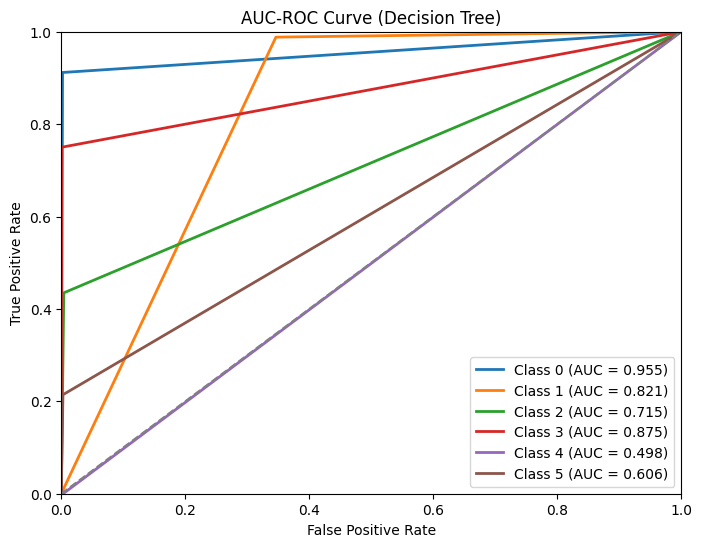

In [ ]:
num_classes = len(set(y_test))
y_test_bin = label_binarize(y_test, classes=list(set(y_test)))

tree_pred_prob = tree_model.predict_proba(X_test)

plt.figure(figsize=(8, 6))
for i in range(num_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], tree_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'Class {i} (AUC = {roc_auc:.3f})')

plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve (Decision Tree)')
plt.legend(loc='lower right')
plt.show()

Decision Tree with Bagging

In [ ]:
tree_bagging = BaggingClassifier(estimator=tree_model, n_estimators=10, random_state=42)

In [ ]:
tree_bagging.fit(X_train, y_train)

BaggingClassifier(estimator=DecisionTreeClassifier(random_state=42),
                  random_state=42)

In [ ]:
tree_bagging_pred = tree_bagging.predict(X_test)

In [ ]:
print(classification_report(y_test, tree_bagging_pred))

              precision    recall  f1-score   support

           0       0.81      0.74      0.77        34
           1       0.98      0.99      0.99      2896
           2       0.55      0.48      0.51        23
           3       0.86      0.68      0.76        28
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00        14

    accuracy                           0.98      3000
   macro avg       0.53      0.48      0.50      3000
weighted avg       0.97      0.98      0.97      3000



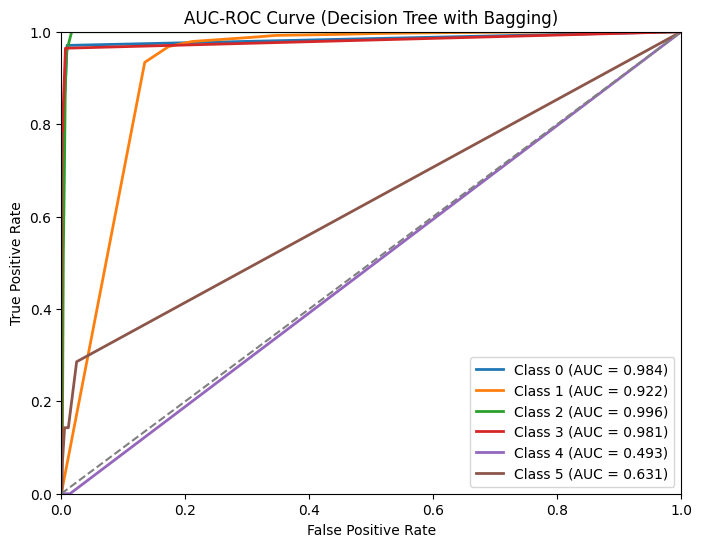

In [ ]:
y_test_bin = label_binarize(y_test, classes=np.unique(y))
num_classes = y_test_bin.shape[1]

y_probs = tree_bagging.predict_proba(X_test)

plt.figure(figsize=(8, 6))
for i in range(num_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_probs[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'Class {i} (AUC = {roc_auc:.3f})')

plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve (Decision Tree with Bagging)')
plt.legend(loc='lower right')
plt.show()

In [ ]:
metrics = evaluate_multiclass(y_test, tree_bagging_pred, y_probs)
print(metrics)

{'Accuracy': 0.9776666666666667, 'Precision (Macro)': 0.5340593503990971, 'Recall (Macro)': 0.48098515769507416, 'F1 Score (Macro)': 0.5049770187722716, 'ROC AUC Score (Macro)': np.float64(0.8344140625629581)}


<Axes: >

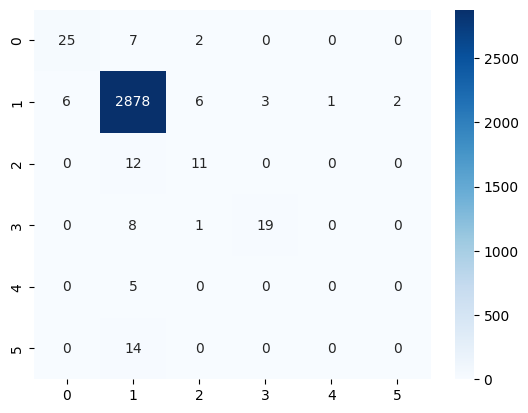

In [ ]:
cm = confusion_matrix(y_test, tree_bagging_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')

Grid Search CV

In [ ]:
param_grid = {
    'n_estimators': [10,50,100],
    'estimator__max_depth': [5,10,20],
    'estimator__min_samples_split': [2,5,10],
    'estimator__min_samples_leaf': [1,2,4]
}

In [ ]:
grid_search = GridSearchCV(tree_bagging,param_grid,scoring='f1_weighted', cv=3,n_jobs=-1)

In [ ]:
grid_search.fit(X_train,y_train)

GridSearchCV(cv=3,
             estimator=BaggingClassifier(estimator=DecisionTreeClassifier(random_state=42),
                                         random_state=42),
             n_jobs=-1,
             param_grid={'estimator__max_depth': [5, 10, 20],
                         'estimator__min_samples_leaf': [1, 2, 4],
                         'estimator__min_samples_split': [2, 5, 10],
                         'n_estimators': [10, 50, 100]},
             scoring='f1_weighted')

In [ ]:
best_model = grid_search.best_estimator_

In [ ]:
tree_bagging_pred_cv = best_model.predict(X_test)

In [ ]:
print(classification_report(y_test,tree_bagging_pred_cv))

              precision    recall  f1-score   support

           0       0.86      0.71      0.77        34
           1       0.98      1.00      0.99      2896
           2       0.56      0.43      0.49        23
           3       0.85      0.79      0.81        28
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00        14

    accuracy                           0.98      3000
   macro avg       0.54      0.49      0.51      3000
weighted avg       0.97      0.98      0.98      3000



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


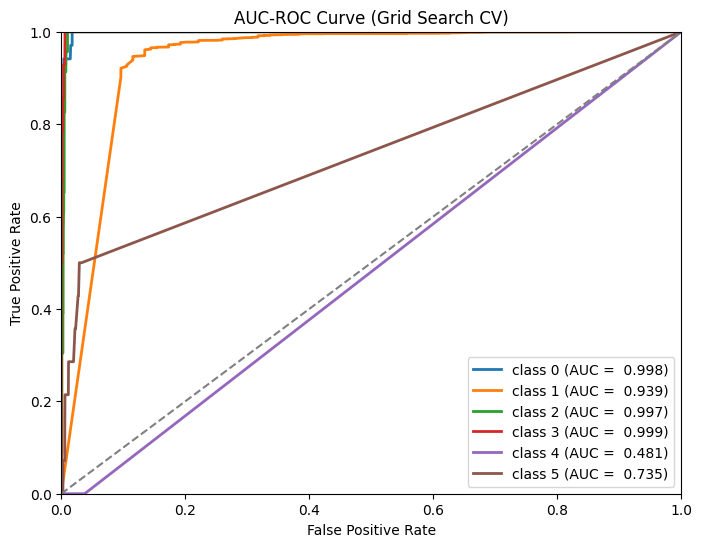

In [ ]:
y_test_bin = label_binarize(y_test,classes=grid_search.best_estimator_.classes_)

y_probs = grid_search.best_estimator_.predict_proba(X_test)

plt.figure(figsize=(8,6))
for i in range(y_test_bin.shape[1]):
  fpr,tpr, _ = roc_curve(y_test_bin[:,i],y_probs[:,i])
  roc_auc = auc(fpr,tpr)
  plt.plot(fpr,tpr,lw=2, label=f'class {i} (AUC = {roc_auc: .3f})')

plt.plot([0,1],[0,1], color='gray', linestyle='--')

plt.xlim([0.0,1.0])
plt.ylim([0.0,1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve (Grid Search CV)')
plt.legend(loc='lower right')
plt.show()

Random Forest

In [ ]:
forest_model = RandomForestClassifier(random_state=42)

In [ ]:
forest_model.fit(X_train,y_train)

RandomForestClassifier(random_state=42)

In [ ]:
forest_pred = forest_model.predict(X_test)

In [ ]:
print(classification_report(y_test, forest_pred, zero_division=0))

              precision    recall  f1-score   support

           0       0.83      0.74      0.78        34
           1       0.99      1.00      0.99      2896
           2       0.65      0.57      0.60        23
           3       0.84      0.75      0.79        28
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00        14

    accuracy                           0.98      3000
   macro avg       0.55      0.51      0.53      3000
weighted avg       0.97      0.98      0.98      3000



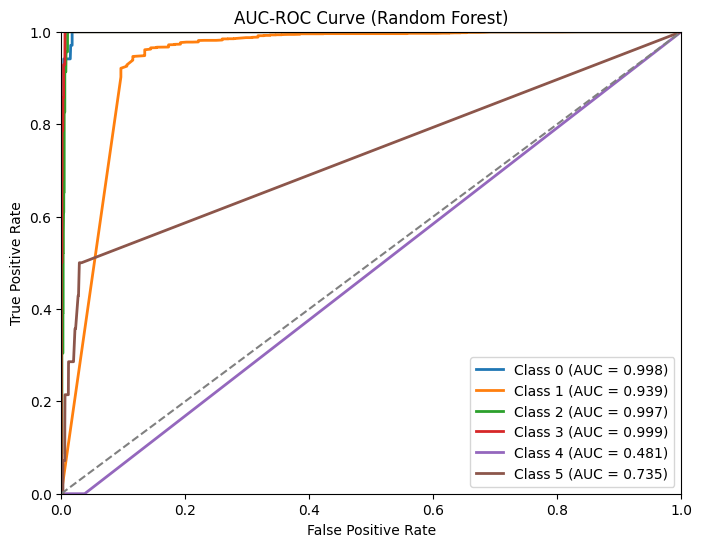

In [ ]:
num_classes = len(set(y_test))
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))


plt.figure(figsize=(8, 6))
for i in range(num_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_probs[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'Class {i} (AUC = {roc_auc:.3f})')

plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve (Random Forest)')
plt.legend(loc='lower right')
plt.show()

Random Forest with Bagging

In [ ]:
forest_bagging = BaggingClassifier(estimator=forest_model,n_estimators=10,random_state=42)

In [ ]:
forest_bagging.fit(X_train,y_train)

BaggingClassifier(estimator=RandomForestClassifier(random_state=42),
                  random_state=42)

In [ ]:
forest_bagging_pred = forest_bagging.predict(X_test)

In [ ]:
print(classification_report(y_test,forest_bagging_pred, zero_division=0))

              precision    recall  f1-score   support

           0       0.84      0.62      0.71        34
           1       0.98      1.00      0.99      2896
           2       0.59      0.43      0.50        23
           3       0.81      0.61      0.69        28
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00        14

    accuracy                           0.98      3000
   macro avg       0.54      0.44      0.48      3000
weighted avg       0.97      0.98      0.97      3000



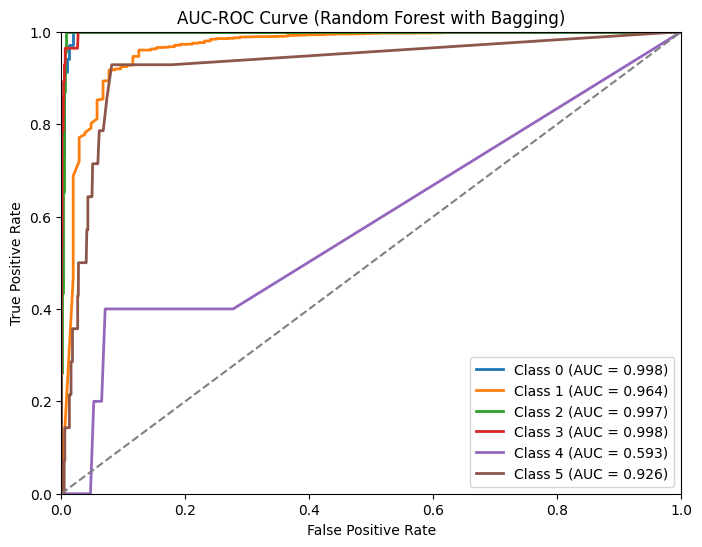

In [ ]:
y_probs = forest_bagging.predict_proba(X_test)

num_classes = len(np.unique(y))
y_test_bin = label_binarize(y_test,classes=np.unique(y))

plt.figure(figsize=(8,6))


for i in range(num_classes):
  fpr, tpr, _ =roc_curve(y_test_bin[:,i], y_probs[:, i])
  roc_auc = auc(fpr,tpr)
  plt.plot(fpr,tpr, lw=2, label=f'Class {i} (AUC = {roc_auc :.3f})')

plt.plot([0,1],[0,1], color='gray', linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0,1.0])

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve (Random Forest with Bagging)')
plt.legend(loc='lower right')
plt.show()

In [ ]:
metrics = evaluate_multiclass(y_test, forest_bagging_pred, y_probs)
print(metrics)

{'Accuracy': 0.9776666666666667, 'Precision (Macro)': 0.5366756603901349, 'Recall (Macro)': 0.4426290303534337, 'F1 Score (Macro)': 0.4824902234369908, 'ROC AUC Score (Macro)': np.float64(0.9126204207645358)}


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


<Axes: >

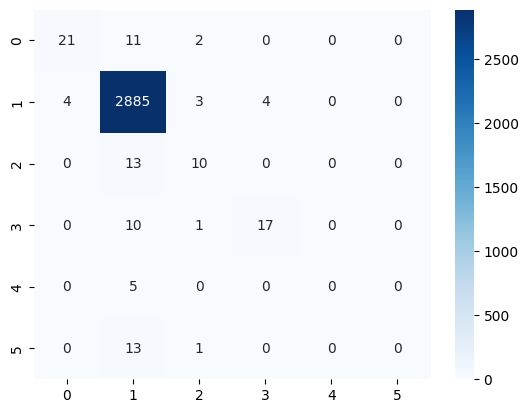

In [ ]:
cm = confusion_matrix(y_test, forest_bagging_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')

Hyperparameter Tuning for Random Forest

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
param_grid = {
    'n_estimators': [50,100,200],
    'max_depth': [10,20,None],
    'min_samples_split': [2,5,10],
    'min_samples_leaf':[1,2,4],
    'max_features':['sqrt','log2']
}

In [ ]:
forest_model = RandomForestClassifier(random_state=42)

In [ ]:
Random_search = RandomizedSearchCV(
    estimator=forest_model,param_distributions = param_grid,
    n_iter=10, cv=5,scoring='f1_weighted', random_state=42, n_jobs=-1
)

In [ ]:
Random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42),
                   n_jobs=-1,
                   param_distributions={'max_depth': [10, 20, None],
                                        'max_features': ['sqrt', 'log2'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [50, 100, 200]},
                   random_state=42, scoring='f1_weighted')

In [ ]:
best_params = Random_search.best_params_

In [ ]:
print("Best Hyperparameters: ", best_params)

Best Hyperparameters:  {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': None}


In [ ]:
forest_model_best = RandomForestClassifier(**best_params, random_state=42)

In [ ]:
forest_bagging = BaggingClassifier(estimator=forest_model_best, n_estimators=10, random_state=42)

In [ ]:
forest_bagging.fit(X_train,y_train)

BaggingClassifier(estimator=RandomForestClassifier(random_state=42),
                  random_state=42)

In [ ]:
forest_bagging_pred = forest_bagging.predict(X_test)

In [ ]:
print(classification_report(y_test, forest_bagging_pred, zero_division=0))

              precision    recall  f1-score   support

           0       0.84      0.62      0.71        34
           1       0.98      1.00      0.99      2896
           2       0.59      0.43      0.50        23
           3       0.81      0.61      0.69        28
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00        14

    accuracy                           0.98      3000
   macro avg       0.54      0.44      0.48      3000
weighted avg       0.97      0.98      0.97      3000



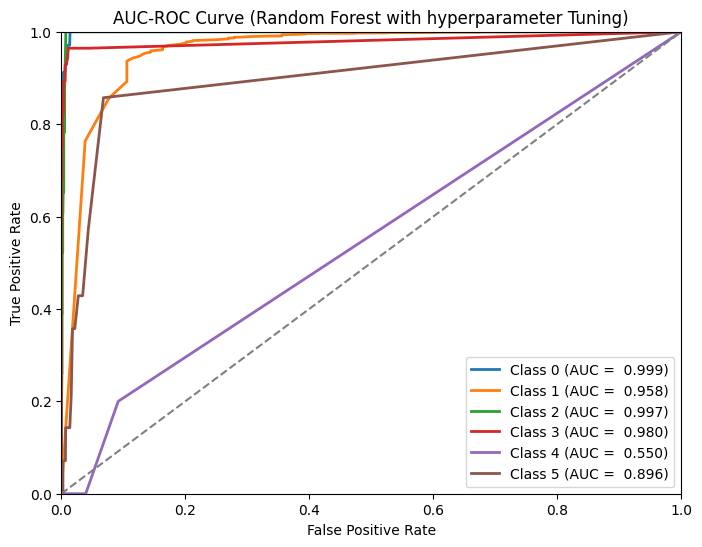

In [ ]:
best_rf = Random_search.best_estimator_

y_probs = best_rf.predict_proba(X_test)

y_test_bin = label_binarize(y_test,classes=np.unique(y))
plt.figure(figsize=(8,6))
for i in range(y_test_bin.shape[1]):
  fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_probs[:,i])
  roc_auc = auc(fpr,tpr)
  plt.plot(fpr,tpr, lw=2, label=f'Class {i} (AUC = {roc_auc: .3f})')

plt.plot([0,1],[0,1], color='gray', linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve (Random Forest with hyperparameter Tuning)')
plt.legend(loc='lower right')
plt.show()

## Boosting

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.utils.class_weight import compute_class_weight
from sklearn.multiclass import OneVsRestClassifier

In [ ]:
model = AdaBoostClassifier(n_estimators=10, learning_rate=1)

In [ ]:
model.fit(X_train, y_train)

AdaBoostClassifier(learning_rate=1, n_estimators=10)

In [ ]:
y_pred_adaboost = model.predict(X_test)

In [ ]:
print(classification_report(y_test,y_pred_adaboost,zero_division=0))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        34
           1       0.97      1.00      0.98      2896
           2       0.00      0.00      0.00        23
           3       0.56      0.36      0.43        28
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00        14

    accuracy                           0.97      3000
   macro avg       0.25      0.23      0.24      3000
weighted avg       0.94      0.97      0.95      3000



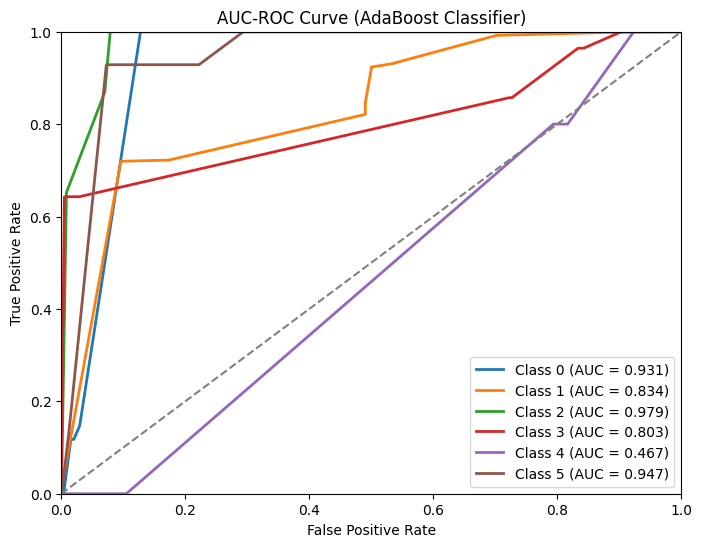

In [ ]:
y_test_bin = label_binarize(y_test, classes=np.unique(y))
num_classes = y_test_bin.shape[1]

y_probs = model.predict_proba(X_test)

plt.figure(figsize=(8,6))
for i in range(num_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_probs[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'Class {i} (AUC = {roc_auc:.3f})')

plt.plot([0,1], [0,1], color='gray', linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve (AdaBoost Classifier)')
plt.legend(loc='lower right')
plt.show()

In [ ]:
metrics = evaluate_multiclass(y_test, y_pred_adaboost, y_probs)
print(metrics)

{'Accuracy': 0.967, 'Precision (Macro)': 0.2541731872717788, 'Recall (Macro)': 0.2259027229676401, 'F1 Score (Macro)': 0.23640842049203367, 'ROC AUC Score (Macro)': np.float64(0.8267775568553745)}


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


<Axes: >

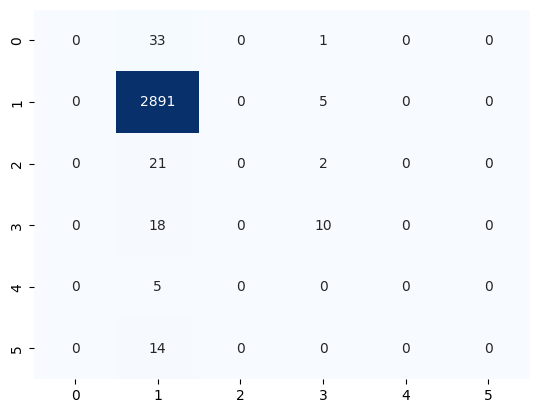

In [ ]:
cm = confusion_matrix(y_test, y_pred_adaboost)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)

Hyperparameter Tuning

In [ ]:
param_grid = {
    'n_estimators': [50,100,200,500],
    'learning_rate': [0.01,0.1,0.5,1],
    'estimator': [DecisionTreeClassifier(max_depth=1),
                  DecisionTreeClassifier(max_depth=3)]
}

In [ ]:
ada_model = AdaBoostClassifier(random_state=42)

In [ ]:
random_search = RandomizedSearchCV(
    estimator=ada_model,param_distributions=param_grid,
    n_iter=10,cv=5,scoring='f1_weighted', random_state=42, n_jobs=-1
)

In [ ]:
random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=AdaBoostClassifier(random_state=42),
                   n_jobs=-1,
                   param_distributions={'estimator': [DecisionTreeClassifier(max_depth=1),
                                                      DecisionTreeClassifier(max_depth=3)],
                                        'learning_rate': [0.01, 0.1, 0.5, 1],
                                        'n_estimators': [50, 100, 200, 500]},
                   random_state=42, scoring='f1_weighted')

In [ ]:
best_params = random_search.best_params_
print("Best Hyperparameters :", best_params)

Best Hyperparameters : {'n_estimators': 100, 'learning_rate': 0.5, 'estimator': DecisionTreeClassifier(max_depth=3)}


In [ ]:
model_best = AdaBoostClassifier(**best_params,random_state=42)
model_best.fit(X_train, y_train)

AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=3),
                   learning_rate=0.5, n_estimators=100, random_state=42)

In [ ]:
y_pred_adaboost = model_best.predict(X_test)

In [ ]:
print(classification_report(y_test,y_pred_adaboost, zero_division=0))

              precision    recall  f1-score   support

           0       0.81      0.65      0.72        34
           1       0.98      0.99      0.99      2896
           2       0.48      0.52      0.50        23
           3       0.87      0.71      0.78        28
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00        14

    accuracy                           0.97      3000
   macro avg       0.52      0.48      0.50      3000
weighted avg       0.97      0.97      0.97      3000



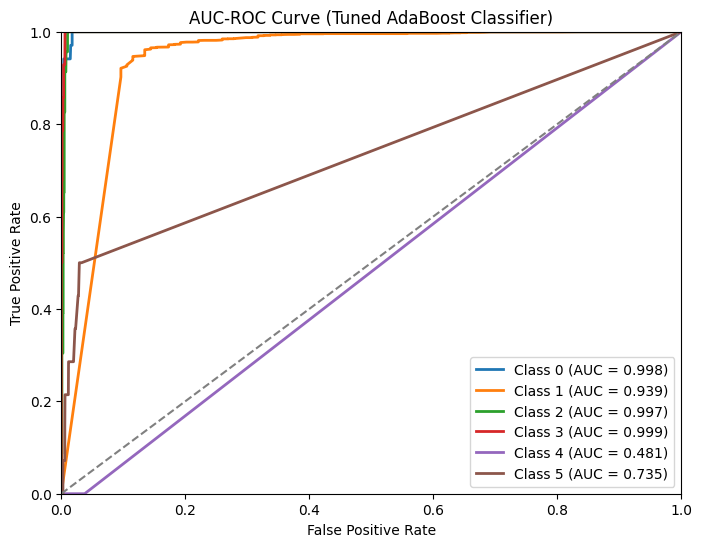

In [ ]:
y_test_bin = label_binarize(y_test, classes=np.unique(y))
num_classes = y_test_bin.shape[1]

y_probs = best_model.predict_proba(X_test)

plt.figure(figsize=(8,6))
for i in range(num_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_probs[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'Class {i} (AUC = {roc_auc:.3f})')

plt.plot([0,1], [0,1], color='gray', linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve (Tuned AdaBoost Classifier)')
plt.legend(loc='lower right')
plt.show()

In [ ]:
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}

In [ ]:
base_tree = DecisionTreeClassifier(max_depth=3, class_weight=class_weight_dict, random_state=42)

In [ ]:
model = AdaBoostClassifier(estimator=base_tree, n_estimators=200, learning_rate=0.1, random_state=42)
model.fit(X_train,y_train)

AdaBoostClassifier(estimator=DecisionTreeClassifier(class_weight={0: np.float64(14.957264957264957),
                                                                  1: np.float64(0.1726860074995066),
                                                                  2: np.float64(21.21212121212121),
                                                                  3: np.float64(17.412935323383085),
                                                                  4: np.float64(89.74358974358974),
                                                                  5: np.float64(37.634408602150536)},
                                                    max_depth=3,
                                                    random_state=42),
                   learning_rate=0.1, n_estimators=200, random_state=42)

In [ ]:
y_pred = model.predict(X_test)

In [ ]:
print(classification_report(y_test,y_pred, zero_division=0))

              precision    recall  f1-score   support

           0       0.08      0.79      0.15        34
           1       1.00      0.78      0.87      2896
           2       0.29      0.87      0.43        23
           3       0.46      0.75      0.57        28
           4       0.00      0.00      0.00         5
           5       0.04      0.86      0.08        14

    accuracy                           0.78      3000
   macro avg       0.31      0.67      0.35      3000
weighted avg       0.97      0.78      0.85      3000



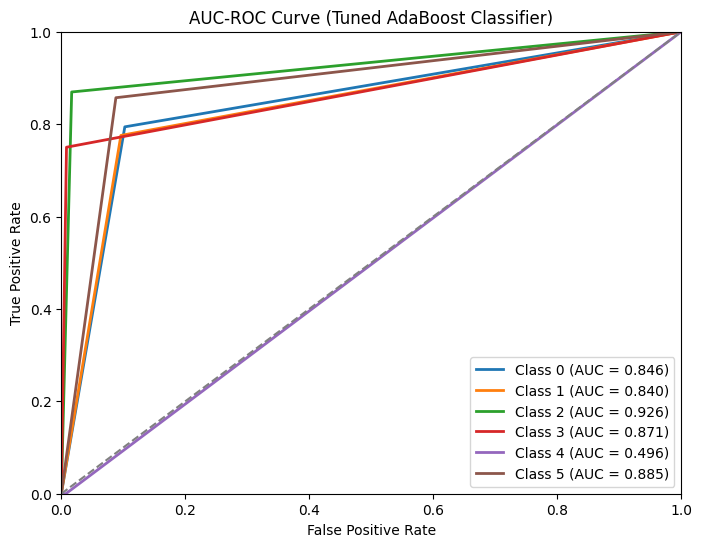

In [ ]:
y_test_bin = label_binarize(y_test, classes=np.unique(y))
num_classes = y_test_bin.shape[1]

y_probs = model.predict_proba(X_test)

plt.figure(figsize=(8,6))
for i in range(num_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_probs[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'Class {i} (AUC = {roc_auc:.3f})')

plt.plot([0,1], [0,1], color='gray', linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve (Tuned AdaBoost Classifier)')
plt.legend(loc='lower right')
plt.show()

Using Different Base Learners SVC

In [ ]:
from sklearn.svm import SVC

In [ ]:
svc = SVC(probability=True, kernel='linear')

In [ ]:
svc.fit(X_train, y_train)

SVC(kernel='linear', probability=True)

In [ ]:
y_pred_svc = svc.predict(X_test)

In [ ]:
print("Accuracy: ", accuracy_score(y_test,y_pred_svc))

Accuracy:  0.9763333333333334


In [ ]:
print(classification_report(y_test, y_pred, zero_division=0))

              precision    recall  f1-score   support

           0       0.08      0.79      0.15        34
           1       1.00      0.78      0.87      2896
           2       0.29      0.87      0.43        23
           3       0.46      0.75      0.57        28
           4       0.00      0.00      0.00         5
           5       0.04      0.86      0.08        14

    accuracy                           0.78      3000
   macro avg       0.31      0.67      0.35      3000
weighted avg       0.97      0.78      0.85      3000



In [ ]:
metrics = evaluate_multiclass(y_test, y_pred_svc, y_probs)
print(metrics)

{'Accuracy': 0.9763333333333334, 'Precision (Macro)': 0.5448535653650254, 'Recall (Macro)': 0.41543320727282024, 'F1 Score (Macro)': 0.4627310840446433, 'ROC AUC Score (Macro)': np.float64(0.8105915726291887)}


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


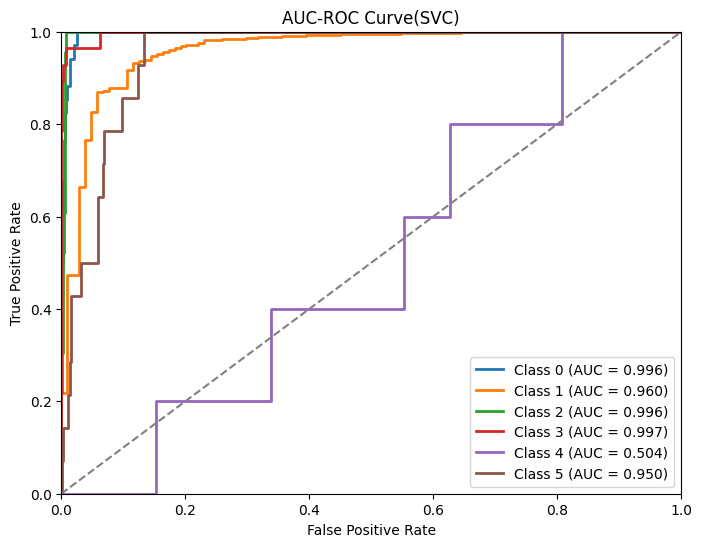

In [ ]:
y_probs = svc.predict_proba(X_test)
num_classes = len(np.unique(y_test))
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))

plt.figure(figsize=(8,6))
for i in range(num_classes):
  fpr, tpr, _ = roc_curve(y_test_bin[:,i], y_probs[:,i])
  roc_auc = auc(fpr,tpr)
  plt.plot(fpr,tpr, lw=2, label=f'Class {i} (AUC = {roc_auc:.3f})')

plt.plot([0,1],[0,1], color='gray', linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve(SVC)')
plt.legend(loc='lower right')

## SVC with AdaBoost

---



In [ ]:
svc_adaBoost = AdaBoostClassifier(estimator=svc, n_estimators=10, learning_rate=1)

In [ ]:
svc_adaBoost.fit(X_train, y_train)

AdaBoostClassifier(estimator=SVC(kernel='linear', probability=True),
                   learning_rate=1, n_estimators=10)

In [ ]:
y_pred_svc_adaboost = svc_adaBoost.predict(X_test)

In [ ]:
print(classification_report(y_test, y_pred_svc_adaboost, zero_division=0))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        34
           1       0.97      1.00      0.98      2896
           2       0.00      0.00      0.00        23
           3       0.00      0.00      0.00        28
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00        14

    accuracy                           0.97      3000
   macro avg       0.16      0.17      0.16      3000
weighted avg       0.93      0.97      0.95      3000



In [ ]:
metrics = evaluate_multiclass(y_test, y_pred_svc_adaboost, y_probs)
print(metrics)

{'Accuracy': 0.9653333333333334, 'Precision (Macro)': 0.1608888888888889, 'Recall (Macro)': 0.16666666666666666, 'F1 Score (Macro)': 0.16372682044323836, 'ROC AUC Score (Macro)': np.float64(0.9005980963384187)}


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


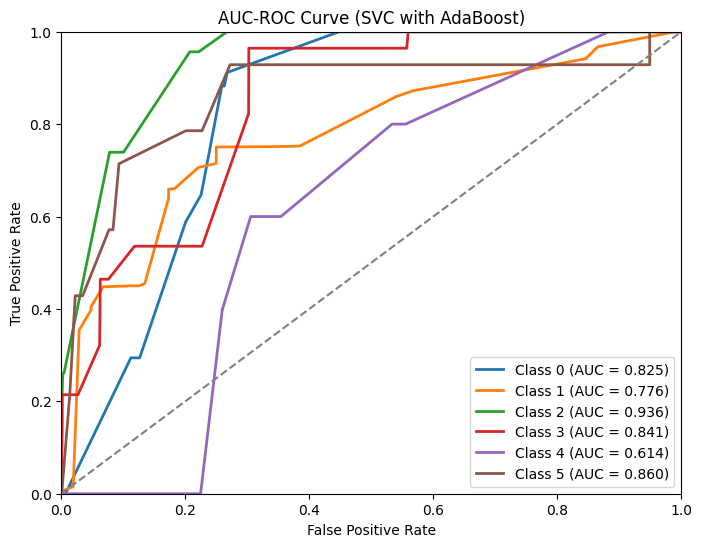

In [ ]:
y_probs = svc_adaBoost.predict_proba(X_test)
num_classes = len(np.unique(y_test))
y_test_bin = label_binarize(y_test, classes = np.unique(y_test))
plt.figure(figsize=(8, 6))
for i in range(num_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_probs[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'Class {i} (AUC = {roc_auc:.3f})')

plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve (SVC with AdaBoost)')
plt.legend(loc='lower right')
plt.show()

Gradient Boosting

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

In [ ]:
gbc = GradientBoostingClassifier(n_estimators=10, learning_rate=0.1, max_depth=5, random_state=101)

In [ ]:
gbc.fit(X_train,y_train)

GradientBoostingClassifier(max_depth=5, n_estimators=10, random_state=101)

In [ ]:
y_pred_gbc = gbc.predict(X_test)

In [ ]:
print(classification_report(y_test, y_pred_gbc, zero_division=0))

              precision    recall  f1-score   support

           0       0.90      0.79      0.84        34
           1       0.99      0.99      0.99      2896
           2       0.56      0.61      0.58        23
           3       0.82      0.64      0.72        28
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00        14

    accuracy                           0.98      3000
   macro avg       0.54      0.51      0.52      3000
weighted avg       0.97      0.98      0.97      3000



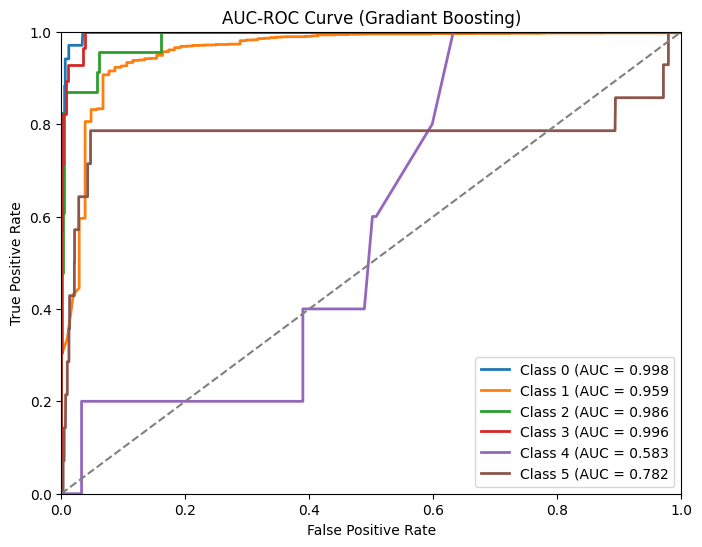

In [ ]:
y_probs = gbc.predict_proba(X_test)
num_classes = len(np.unique(y_test))
y_test_bin = label_binarize(y_test, classes = np.unique(y_test))

plt.figure(figsize=(8,6))
for i in range(num_classes):
  fpr,tpr, _ = roc_curve(y_test_bin[:,i], y_probs[:, i])
  roc_auc = auc(fpr, tpr)
  plt.plot(fpr,tpr, lw=2, label=f'Class {i} (AUC = {roc_auc:.3f}')


plt.plot([0,1],[0,1], color='gray', linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve (Gradiant Boosting)')
plt.legend(loc='lower right')
plt.show()

In [ ]:
metrics = evaluate_multiclass(y_test, y_pred_gbc, y_probs)
print(metrics)

{'Accuracy': 0.9753333333333334, 'Precision (Macro)': 0.543957311165974, 'Recall (Macro)': 0.5059427716558639, 'F1 Score (Macro)': 0.5224754163077807, 'ROC AUC Score (Macro)': np.float64(0.8838324089352064)}


<Axes: >

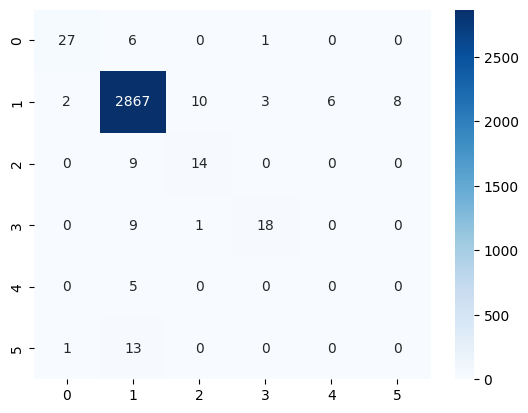

In [ ]:
cm = confusion_matrix(y_test, y_pred_gbc)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')

LightGBM

In [ ]:
import lightgbm as lgb
from lightgbm import LGBMClassifier

In [ ]:
lgb_clf = lgb.LGBMClassifier(
    obective= 'multiclass',
    num_class= 6,

    boosting_type = 'gbdt',

    learning_rate = 0.1,
    max_dept = 3,
    n_estimators=100,


)

In [ ]:
lgb_clf.fit(X_train, y_train)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] Unknown parameter: max_dept
[LightGBM] [Warning] Unknown parameter: obective
[LightGBM] [Warning] Unknown parameter: max_dept
[LightGBM] [Warning] Unknown parameter: obective
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 920
[LightGBM] [Info] Number of data points in the train set: 7000, number of used features: 5
[LightGBM] [Info] Start training from score -4.496957
[LightGBM] [Info] Start training from score -0.035479
[LightGBM] [Info] Start training from score -4.846332
[LightGBM] [Info] Start training from score -4.648973
[LightGBM] [Info] Start training from score -6.288716
[LightGBM] [Info] Start training from score -5.419678
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

LGBMClassifier(max_dept=3, num_class=6, obective='multiclass')

In [ ]:
y_pred_lgb = lgb_clf.predict(X_test)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] Unknown parameter: max_dept
[LightGBM] [Warning] Unknown parameter: obective


In [ ]:
print(classification_report(y_test, y_pred_lgb))

              precision    recall  f1-score   support

           0       0.97      0.85      0.91        34
           1       0.99      1.00      0.99      2896
           2       0.52      0.48      0.50        23
           3       0.86      0.68      0.76        28
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00        14

    accuracy                           0.98      3000
   macro avg       0.56      0.50      0.53      3000
weighted avg       0.97      0.98      0.98      3000



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] Unknown parameter: max_dept
[LightGBM] [Warning] Unknown parameter: obective


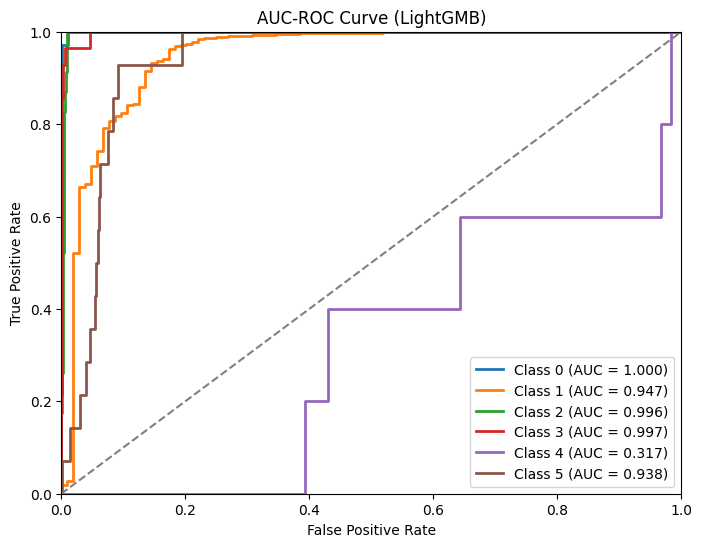

In [ ]:
y_test_bin = label_binarize(y_test, classes=np.unique(y_train))
num_classes = y_test_bin.shape[1]

y_probs = lgb_clf.predict_proba(X_test)

plt.figure(figsize=(8,6))
for i in range(num_classes):
  fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_probs[:, i])
  roc_auc = auc(fpr,tpr)
  plt.plot(fpr,tpr, lw=2, label=f'Class {i} (AUC = {roc_auc:.3f})')


plt.plot([0,1],[0,1], color="gray", linestyle="--")

plt.xlim([0.0,1.0])
plt.ylim([0.0, 1.0])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("AUC-ROC Curve (LightGMB)")
plt.legend(loc="lower right")
plt.show()

In [ ]:
metrics = evaluate_multiclass(y_test, y_pred_lgb, y_probs)
print(metrics)

{'Accuracy': 0.9816666666666667, 'Precision (Macro)': 0.5566841729807224, 'Recall (Macro)': 0.5010534059888668, 'F1 Score (Macro)': 0.5262486046711317, 'ROC AUC Score (Macro)': np.float64(0.8658429973161037)}


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


<Axes: >

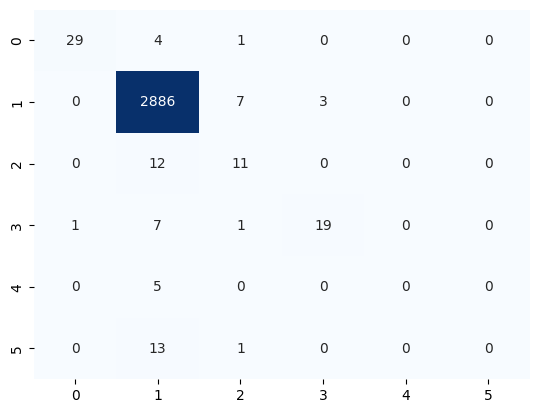

In [ ]:
cm = confusion_matrix(y_test, y_pred_lgb)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)

CatBoost

In [ ]:
pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 8.2 MB/s eta 0:00:00


In [ ]:
from catboost import CatBoostClassifier

In [ ]:
catboost_model = CatBoostClassifier(
    iterations=100,
    learning_rate=0.1,
    depth=6,
    verbose=0,
    random_seed=42
)

In [ ]:
catboost_model.fit(X_train, y_train)

In [ ]:
y_pred_cat = catboost_model.predict(X_test)

In [ ]:
print(classification_report(y_test,y_pred_cat, zero_division=0))

              precision    recall  f1-score   support

           0       0.82      0.53      0.64        34
           1       0.98      1.00      0.99      2896
           2       0.64      0.39      0.49        23
           3       0.85      0.61      0.71        28
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00        14

    accuracy                           0.98      3000
   macro avg       0.55      0.42      0.47      3000
weighted avg       0.97      0.98      0.97      3000



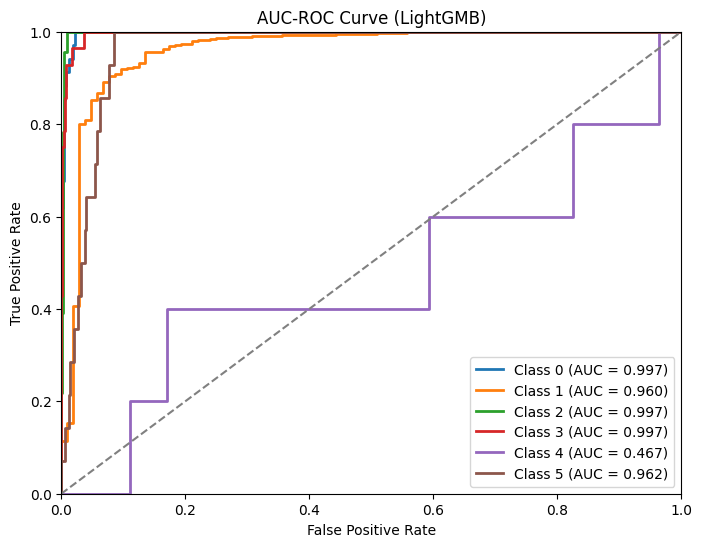

In [ ]:
y_test_bin = label_binarize(y_test, classes=np.unique(y_train))
num_classes = y_test_bin.shape[1]

y_probs = catboost_model.predict_proba(X_test)

plt.figure(figsize=(8,6))
for i in range(num_classes):
  fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_probs[:, i])
  roc_auc = auc(fpr,tpr)
  plt.plot(fpr,tpr, lw=2, label=f'Class {i} (AUC = {roc_auc:.3f})')


plt.plot([0,1],[0,1], color="gray", linestyle="--")

plt.xlim([0.0,1.0])
plt.ylim([0.0, 1.0])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("AUC-ROC Curve (LightGMB)")
plt.legend(loc="lower right")
plt.show()

In [ ]:
metrics = evaluate_multiclass(y_test, y_pred_cat, y_probs)
print(metrics)

{'Accuracy': 0.9776666666666667, 'Precision (Macro)': 0.548726149303595, 'Recall (Macro)': 0.4209069737671672, 'F1 Score (Macro)': 0.4711767540534664, 'ROC AUC Score (Macro)': np.float64(0.8966886085547726)}


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


<Axes: >

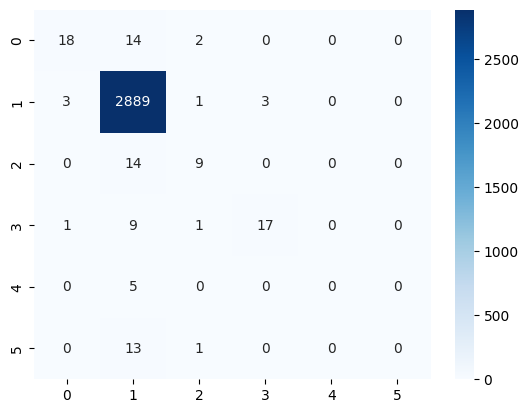

In [ ]:
cm = confusion_matrix(y_test, y_pred_cat)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')

## Stacking

---



In [ ]:
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
base_models = [
    ('DecisionTree', DecisionTreeClassifier(random_state=42)),
    ('RandomForest', RandomForestClassifier(random_state=42, n_estimators=100)),
    ('SVM', SVC(probability=True, random_state=42)),
    ('KNN', KNeighborsClassifier(n_neighbors=5))
]

In [ ]:
meta_model = LogisticRegression(random_state=42)

In [ ]:
n_splits = 5

In [ ]:
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

In [ ]:
meta_features = np.zeros((X_train.shape[0], len(base_models)))

In [ ]:
y_train = np.array(y_train)

Train base models using cross-validation and generate meta features

In [ ]:
meta_features = np.zeros((X_train.shape[0], len(base_models)))
for i, (name, model) in enumerate(base_models):
    meta_feature_fold = np.zeros((X_train.shape[0],))
    for train_idx, valid_idx in skf.split(X_train, y_train):
        X_fold_train, X_fold_valid = X_train[train_idx], X_train[valid_idx]
        y_fold_train, y_fold_valid = y_train[train_idx], y_train[valid_idx]

        model.fit(X_fold_train, y_fold_train)
        meta_feature_fold[valid_idx] = model.predict(X_fold_valid)

    meta_features[:, i] = meta_feature_fold

In [ ]:
meta_model.fit(meta_features, y_train)

LogisticRegression(random_state=42)

In [ ]:
meta_features_test = np.zeros((X_test.shape[0], len(base_models)))

In [ ]:
for i, (name, model) in enumerate(base_models):
    model.fit(X_train, y_train)
    meta_features_test[:, i] = model.predict(X_test)

In [ ]:
y_pred_stack = meta_model.predict(meta_features_test)

In [ ]:
print(classification_report(y_test, y_pred_stack, zero_division=0))

              precision    recall  f1-score   support

           0       0.87      0.76      0.81        34
           1       0.98      1.00      0.99      2896
           2       0.12      0.04      0.06        23
           3       0.85      0.61      0.71        28
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00        14

    accuracy                           0.98      3000
   macro avg       0.47      0.40      0.43      3000
weighted avg       0.97      0.98      0.97      3000



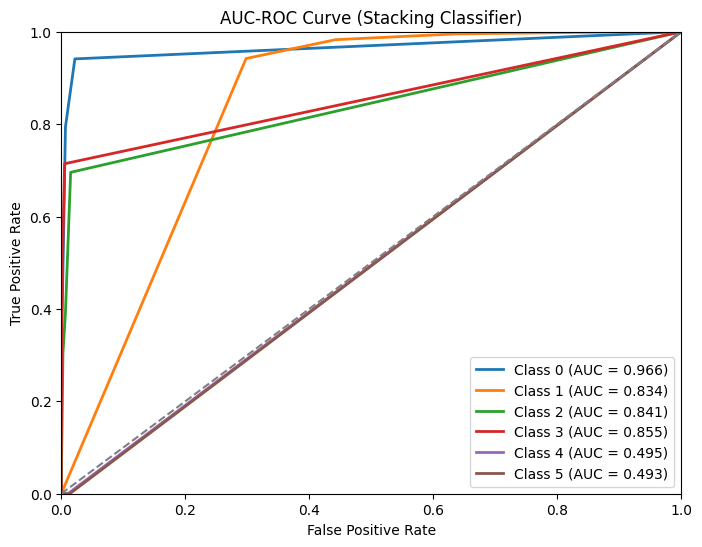

In [ ]:
y_test_bin = label_binarize(y_test, classes=np.unique(y_train))
num_classes = y_test_bin.shape[1]

y_probs = model.predict_proba(X_test)

plt.figure(figsize=(8,6))
for i in range(num_classes):
  fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_probs[:, i])
  roc_auc = auc(fpr,tpr)
  plt.plot(fpr,tpr, lw=2, label=f'Class {i} (AUC = {roc_auc:.3f})')


plt.plot([0,1],[0,1], color="gray", linestyle="--")

plt.xlim([0.0,1.0])
plt.ylim([0.0, 1.0])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("AUC-ROC Curve (Stacking Classifier)")
plt.legend(loc="lower right")
plt.show()

In [ ]:
metrics = evaluate_multiclass(y_test, y_pred_stack, y_probs)
print(metrics)

{'Accuracy': 0.9763333333333334, 'Precision (Macro)': 0.47038201525795004, 'Recall (Macro)': 0.4019214429706545, 'F1 Score (Macro)': 0.4289502729613544, 'ROC AUC Score (Macro)': np.float64(0.7474332514858116)}


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


<Axes: >

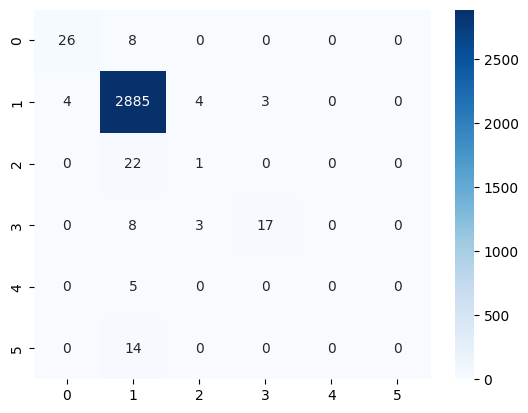

In [ ]:
cm = confusion_matrix(y_test, y_pred_stack)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')

## Voting

---



In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

In [ ]:
log_clf = LogisticRegression(random_state=42)
svc_clf = SVC(probability=True, random_state=42)
dt_clf = DecisionTreeClassifier(random_state=42)
knn_clf = KNeighborsClassifier()
rf_clf = RandomForestClassifier(random_state=42)

In [ ]:
voting_clf = VotingClassifier(
    estimators=[
        ('log_reg', log_clf),
        ('svc', svc_clf),
        ('dt', dt_clf),
        ('knn', knn_clf),
        ('rf', rf_clf)
    ],
    voting='soft'
)

In [ ]:
voting_clf.fit(X_train, y_train)

VotingClassifier(estimators=[('log_reg', LogisticRegression(random_state=42)),
                             ('svc', SVC(probability=True, random_state=42)),
                             ('dt', DecisionTreeClassifier(random_state=42)),
                             ('knn', KNeighborsClassifier()),
                             ('rf', RandomForestClassifier(random_state=42))],
                 voting='soft')

In [ ]:
for clf_name, clf in voting_clf.named_estimators_.items():
  clf.fit(X_train, y_train)
  y_pred = clf.predict(X_test)
  print(f"{clf_name} Accuracy: {accuracy_score(y_test, y_pred):.2f}")

log_reg Accuracy: 0.98
svc Accuracy: 0.97
dt Accuracy: 0.98
knn Accuracy: 0.97
rf Accuracy: 0.98


In [ ]:
y_pred_voting = voting_clf.predict(X_test)
print(f"Voting Classifier Accuracy: {accuracy_score(y_test,y_pred_voting):.2f}")

Voting Classifier Accuracy: 0.98


In [ ]:
print(classification_report(y_test,y_pred_voting,zero_division=0))

              precision    recall  f1-score   support

           0       1.00      0.74      0.85        34
           1       0.98      1.00      0.99      2896
           2       0.53      0.39      0.45        23
           3       0.86      0.64      0.73        28
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00        14

    accuracy                           0.98      3000
   macro avg       0.56      0.46      0.50      3000
weighted avg       0.97      0.98      0.98      3000



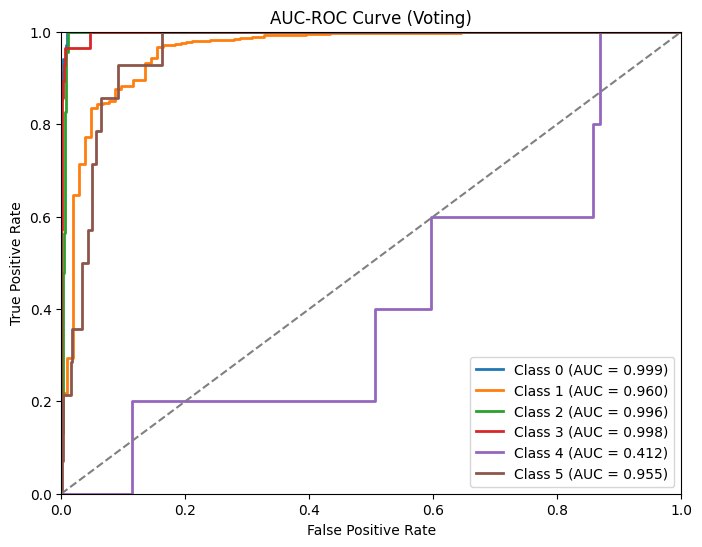

In [ ]:
y_test_bin = label_binarize(y_test, classes=np.unique(y_train))
num_classes = y_test_bin.shape[1]

y_probs = voting_clf.predict_proba(X_test)

plt.figure(figsize=(8,6))
for i in range(num_classes):
  fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_probs[:, i])
  roc_auc = auc(fpr,tpr)
  plt.plot(fpr,tpr, lw=2, label=f'Class {i} (AUC = {roc_auc:.3f})')


plt.plot([0,1],[0,1], color="gray", linestyle="--")

plt.xlim([0.0,1.0])
plt.ylim([0.0, 1.0])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("AUC-ROC Curve (Voting)")
plt.legend(loc="lower right")
plt.show()

In [ ]:
metrics = evaluate_multiclass(y_test, y_pred_voting, y_probs)
print(metrics)

{'Accuracy': 0.98, 'Precision (Macro)': 0.5616451551679575, 'Recall (Macro)': 0.461115529565177, 'F1 Score (Macro)': 0.5037299196164967, 'ROC AUC Score (Macro)': np.float64(0.8865852355115423)}


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


<Axes: >

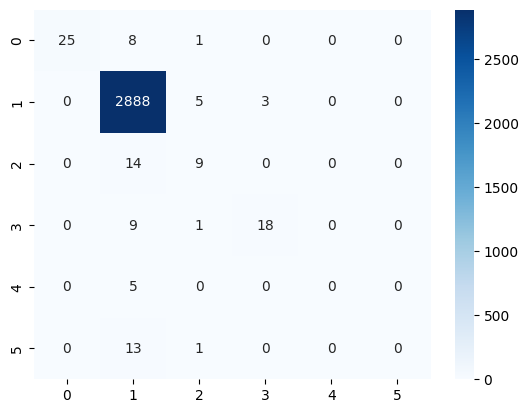

In [ ]:
cm = confusion_matrix(y_test, y_pred_voting)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')

## Blending

---




In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score

In [ ]:
rf = RandomForestClassifier(n_estimators=100, class_weight="balanced", random_state=42)
svm = SVC(probability=True, class_weight="balanced", random_state=42)
knn = KNeighborsClassifier(n_neighbors=6)

In [ ]:
rf.fit(X_train, y_train)
svm.fit(X_train, y_train)
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=6)

In [ ]:
rf_train_pred = rf.predict_proba(X_train)
svm_train_pred = svm.predict_proba(X_train)
knn_train_pred = knn.predict_proba(X_train)

In [ ]:
meta_X_train = np.hstack((rf_train_pred, svm_train_pred, knn_train_pred))

In [ ]:
meta_model_blending = LGBMClassifier(n_estimators=100, random_state=42)

In [ ]:
meta_model_blending.fit(meta_X_train, y_train)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004107 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1752
[LightGBM] [Info] Number of data points in the train set: 7000, number of used features: 18
[LightGBM] [Info] Start training from score -4.496957
[LightGBM] [Info] Start training from score -0.035479
[LightGBM] [Info] Start training from score -4.846332
[LightGBM] [Info] Start training from score -4.648973
[LightGBM] [Info] Start training from score -6.288716
[LightGBM] [Info] Start training from score -5.419678
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

LGBMClassifier(random_state=42)

In [ ]:
rf_test_pred = rf.predict_proba(X_test)
svm_test_pred = svm.predict_proba(X_test)
knn_test_pred = knn.predict_proba(X_test)

In [ ]:
meta_X_test = np.hstack((rf_test_pred, svm_test_pred, knn_test_pred))

In [ ]:
final_pred_blend = meta_model_blending.predict(meta_X_test)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
print(classification_report(y_test, final_pred_blend))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        34
           1       0.96      0.96      0.96      2896
           2       0.00      0.00      0.00        23
           3       0.00      0.00      0.00        28
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00        14

    accuracy                           0.93      3000
   macro avg       0.16      0.16      0.16      3000
weighted avg       0.93      0.93      0.93      3000



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


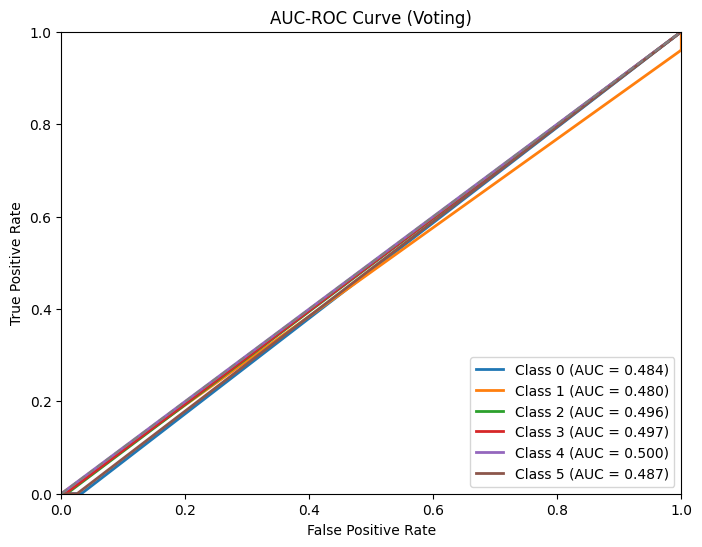

In [ ]:
y_test_bin = label_binarize(y_test, classes=np.unique(y_train))
num_classes = y_test_bin.shape[1]

y_probs = meta_model_blending.predict_proba(meta_X_test)

plt.figure(figsize=(8,6))
for i in range(num_classes):
  fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_probs[:, i])
  roc_auc = auc(fpr,tpr)
  plt.plot(fpr,tpr, lw=2, label=f'Class {i} (AUC = {roc_auc:.3f})')


plt.plot([0,1],[0,1], color="gray", linestyle="--")

plt.xlim([0.0,1.0])
plt.ylim([0.0, 1.0])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("AUC-ROC Curve (Voting)")
plt.legend(loc="lower right")
plt.show()

In [ ]:
metrics = evaluate_multiclass(y_test, final_pred_blend, y_probs)
print(metrics)

{'Accuracy': 0.927, 'Precision (Macro)': 0.1606585788561525, 'Recall (Macro)': 0.16004834254143646, 'F1 Score (Macro)': 0.16035288012454593, 'ROC AUC Score (Macro)': np.float64(0.49061204129976943)}


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


<Axes: >

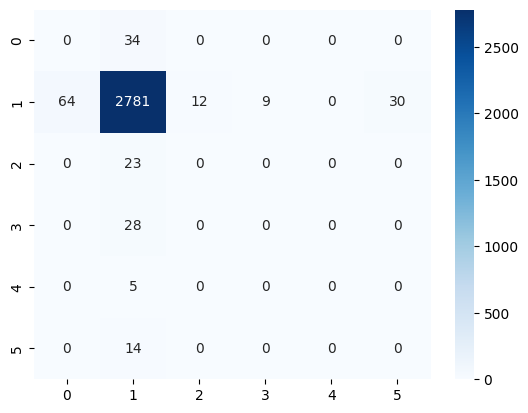

In [ ]:
cm = confusion_matrix(y_test, final_pred_blend)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')

### **XGB Classifier**

In [1]:
from xgboost import XGBClassifier

In [39]:
xgb = XGBClassifier(random_state=42, scale_pos_weight=sum(y_train==0)/sum(y_train==1))

In [40]:
xgb.fit(X_train, y_train)

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [11:06:41] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [41]:
xgb_pred = xgb.predict(X_test)

In [42]:
print("XGBoost Report:\n", classification_report(y_test, xgb_pred))

XGBoost Report:
               precision    recall  f1-score   support

           0       0.94      0.94      0.94        34
           1       0.99      1.00      0.99      2896
           2       0.62      0.65      0.64        23
           3       0.88      0.75      0.81        28
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00        14

    accuracy                           0.98      3000
   macro avg       0.57      0.56      0.56      3000
weighted avg       0.98      0.98      0.98      3000



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


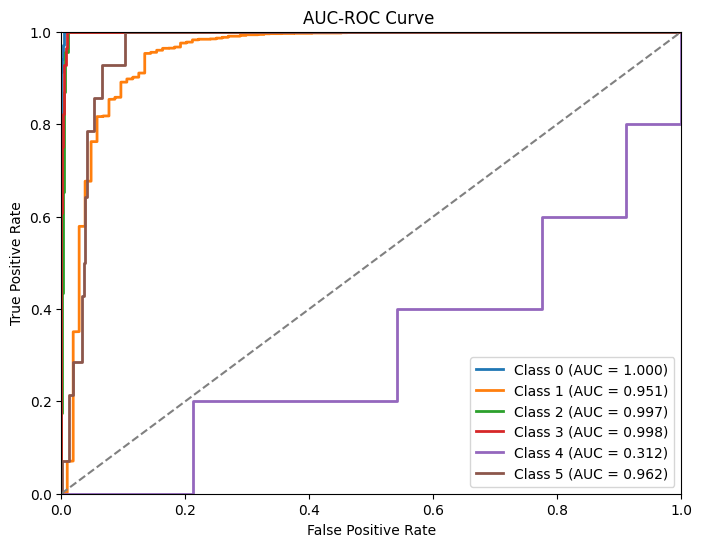

In [47]:
y_test_bin = label_binarize(y_test, classes=np.unique(y_train))
num_classes = y_test_bin.shape[1]

y_probs = xgb.predict_proba(X_test)

plt.figure(figsize=(8,6))
for i in range(num_classes):
  fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_probs[:, i])
  roc_auc = auc(fpr,tpr)
  plt.plot(fpr,tpr, lw=2, label=f'Class {i} (AUC = {roc_auc:.3f})')


plt.plot([0,1],[0,1], color="gray", linestyle="--")

plt.xlim([0.0,1.0])
plt.ylim([0.0, 1.0])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("AUC-ROC Curve ")
plt.legend(loc="lower right")
plt.show()

<Axes: >

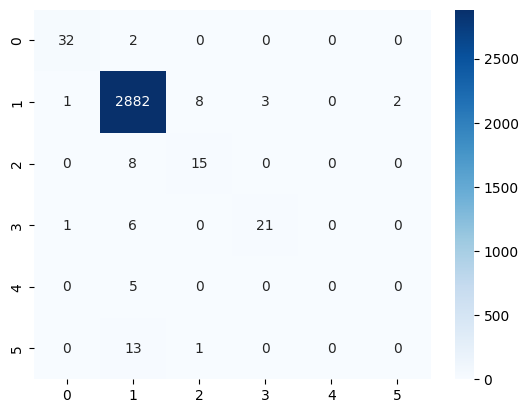

In [45]:
cm = confusion_matrix(y_test, xgb_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')

In [48]:
metrics = evaluate_multiclass(y_test, xgb_pred, y_probs)
print(metrics)

{'Accuracy': 0.9833333333333333, 'Precision (Macro)': 0.5715861104386885, 'Recall (Macro)': 0.5564193549146779, 'F1 Score (Macro)': 0.5631513126120976, 'ROC AUC Score (Macro)': np.float64(0.8700396220446937)}


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


### **Neural Network (ANN)**

In [52]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Input
from tensorflow.keras.callbacks import EarlyStopping

In [53]:

X_train.shape

(7000, 5)

In [54]:
Early_stop = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=25)

In [58]:
model = Sequential()

In [59]:
model.add(Input(shape=(5, )))

In [60]:
model.add(Dense(29, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Dense(15, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Dense(12, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Dense(6, activation='softmax'))

In [61]:

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [63]:
model.fit(x=X_train, y=y_train,
          validation_data=(X_test, y_test),
          batch_size=128, epochs=600, callbacks=[Early_stop])

Epoch 1/600
55/55 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - accuracy: 0.2517 - loss: 2.5425 - val_accuracy: 0.8507 - val_loss: 1.4256
Epoch 2/600
55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.3357 - loss: 2.0416 - val_accuracy: 0.9520 - val_loss: 1.1293
Epoch 3/600
55/55 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.5047 - loss: 1.6246 - val_accuracy: 0.9647 - val_loss: 0.9340
Epoch 4/600
55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6618 - loss: 1.3209 - val_accuracy: 0.9653 - val_loss: 0.7488
Epoch 5/600
55/55 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - accuracy: 0.7875 - loss: 1.0388 - val_accuracy: 0.9653 - val_loss: 0.5674
Epoch 6/600
55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.8742 - loss: 0.8231 - val_accuracy: 0.9653 - val_loss: 0.4233
Epoch 7/600
55/55 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.9119 - loss: 0.6552 - val_accuracy: 0.9653 - val_loss: 0.3281
Epoch 8/600
55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.9260 - loss: 0.5435 - val_accuracy: 0.

In [64]:

model_loss = pd.DataFrame(model.history.history)

<Axes: >

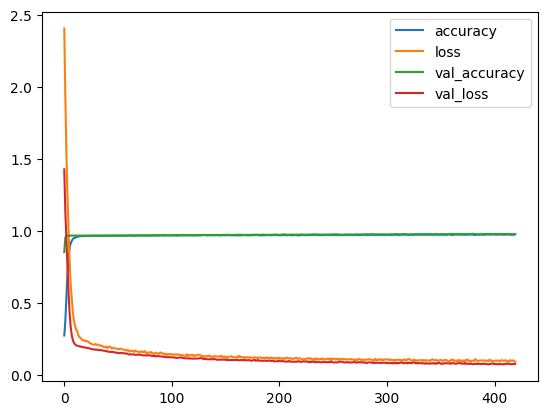

In [65]:
model_loss.plot()

In [66]:
predict = model.predict(X_test)

94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


In [67]:
predict[0]

array([2.6728907e-05, 9.9829745e-01, 3.4042973e-06, 1.3711236e-05,
       1.4608661e-03, 1.9777603e-04], dtype=float32)

In [69]:
np.argmax(predict[0])

np.int64(1)

In [70]:
predict_label = [np.argmax(i) for i in predict]

In [71]:
print(classification_report(y_test, predict_label))

              precision    recall  f1-score   support

           0       0.90      0.26      0.41        34
           1       0.98      1.00      0.99      2896
           2       0.60      0.39      0.47        23
           3       0.88      0.75      0.81        28
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00        14

    accuracy                           0.98      3000
   macro avg       0.56      0.40      0.45      3000
weighted avg       0.97      0.98      0.97      3000



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
